# Face Generation

In [1]:
# run this once to unzip the file
!unzip processed-celeba-small.zip

Archive:  processed-celeba-small.zip
replace processed_celeba_small/.DS_Store? [y]es, [n]o, [A]ll, [N]one, [r]ename: ^C


In [1]:
from glob import glob
from typing import Tuple, Callable, Dict

import os
import matplotlib.pyplot as plt
import numpy as np
import torch
from PIL import Image
from torch.utils.data import DataLoader, Dataset
from torchvision.transforms import Compose, ToTensor, CenterCrop, Normalize, Resize


In [2]:
data_dir = 'processed_celeba_small/celeba/'

## Data pipeline



### Pre-process and Load the Data


In [3]:
def get_transforms(size: Tuple[int, int]) -> Callable:
    """ Transforms to apply to the image."""
    transforms = [ToTensor(),
                  
                  Resize(size),
                  Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])]
    
    return Compose(transforms)

In [4]:
class DatasetDirectory(Dataset):
    """
    A custom dataset class that loads images from folder.
    args:
    - directory: location of the images
    - transform: transform function to apply to the images
    - extension: file format
    """
    def __init__(self, 
                 directory: str, 
                 transforms: Callable = None, 
                 extension: str = '.jpg'):
        self.directory = directory
        self.transform = transforms
        self.extension = extension
        self.image_files = [file for file in os.listdir(directory) if file.endswith(extension)]
       

    def __len__(self) -> int:
        """ returns the number of items in the dataset """

        return len(self.image_files)

    def __getitem__(self, index: int) -> torch.Tensor:
        """ load an image and apply transformation """
        image_path = os.path.join(self.directory, self.image_files[index])
        image = Image.open(image_path).convert('RGB')
        
        if self.transform is not None:
            image = self.transform(image)
        return  image

visualize images from the dataset.

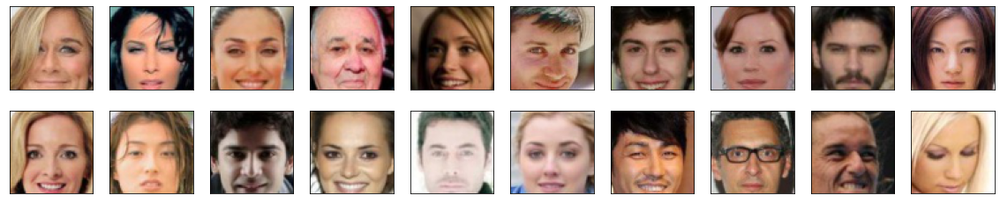

In [6]:
dataset = DatasetDirectory(data_dir, get_transforms((64, 64)))
def denormalize(images):
    """Transform images from [-1.0, 1.0] to [0, 255] and cast them to uint8."""
    return ((images + 1.) / 2. * 255).astype(np.uint8)

# plot the images in the batch, along with the corresponding labels
fig = plt.figure(figsize=(20, 4))
plot_size=20
for idx in np.arange(plot_size):
    ax = fig.add_subplot(2, int(plot_size/2), idx+1, xticks=[], yticks=[])
    img = dataset[idx].numpy()
    img = np.transpose(img, (1, 2, 0))
    img = denormalize(img)
    ax.imshow(img)

## Model implementation


### Discriminator class

In [7]:
from torch import nn

In [8]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        # TODO: instantiate the different layers
        self.conv1 = nn.Conv2d(3, 64, kernel_size = 4, stride=2, padding =1)
        self.conv2 = nn.Conv2d(64, 128, kernel_size = 4, stride=2, padding =1)
        self.conv3 = nn.Conv2d(128, 256, kernel_size = 4, stride=2, padding =1)
        self.conv4 = nn.Conv2d(256, 256*2, kernel_size = 4, stride=2, padding =1)
        
        self.leaky_relu = nn.LeakyReLU(0.2)
        self.sigmoid = nn.Sigmoid()
        self.fc1 = nn.Linear(64*8*2*2*4, 1)
        
        
        
    def forward(self, x: torch.Tensor) -> torch.Tensor:
        # TODO: implement the forward method
        
        x = self.leaky_relu(self.conv1(x))
        x = self.leaky_relu(self.conv2(x))
        x = self.leaky_relu(self.conv3(x))
        x = self.leaky_relu(self.conv4(x))
        
        # Flatten the tensor
        x = x.view(-1, 64*8*2*2*4)
       
        # Apply fully connected layer
        x = self.fc1(x)
       
        
        return x.unsqueeze(2).unsqueeze(3)

### Generator class


In [10]:
#taken from DCGAN excercise
class DeconvBlock(nn.Module):
    def __init__(self,
               in_channels:int,
               out_channels:int,
               kernel_size: int,
               stride:int,
               padding:int,
               batch_norm: bool = True):
        super(DeconvBlock, self).__init__()
        self.deconv = nn.ConvTranspose2d(in_channels, out_channels, kernel_size, stride, padding)
        self.batch_norm = batch_norm
        if self.batch_norm:
            self.bn = nn.BatchNorm2d(out_channels)
        self.activation = nn.ReLU()
        
    def forward(self, x: torch.Tensor):
        x = self.deconv(x)
        if self.batch_norm:
            x = self.bn(x)
        x = self.activation(x)
        return x

In [40]:
class Generator(nn.Module):
    def __init__(self, latent_dim: int):
        super(Generator, self).__init__()
        # TODO: instantiate the different layers
        conv_dim = 64
        
        self.deconv1 = DeconvBlock(latent_dim, conv_dim*4, 4, 1, 0)
        self.deconv2 = DeconvBlock(conv_dim*4, conv_dim*2, 4, 2, 1)
        self.deconv3 = DeconvBlock(conv_dim*2, conv_dim, 4, 2, 1)
        self.deconv4 = DeconvBlock(conv_dim, 32, 4, 2, 1)
        self.deconv5 = nn.ConvTranspose2d(32, 3, 4, stride=2, padding=1)
        self.last_activation = nn.Tanh()
        self.norm = nn.InstanceNorm2d(3)
        
        

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        # TODO: implement the forward method
        
        x = self.deconv1(x)
        x = self.deconv2(x)
        x = self.deconv3(x)
        x = self.deconv4(x)
        
        x = self.deconv5(x)
        x = self.norm(x)
        x = self.last_activation(x)
        
        return x

## Optimizer

In the following section, we create the optimizers for the generator and discriminator. You can use RMSprop if you planning to use gradient clipping or Adam if you use gradient penalty

In [42]:
import torch.optim as optim

lr = 0.0001
beta1 = 0.5
beta2 = 0.999

def create_optimizers(generator: nn.Module, discriminator: nn.Module):
    """ This function should return the optimizers of the generator and the discriminator """
    g_optimizer = optim.Adam(generator.parameters(), lr, betas = (beta1,beta2))
    d_optimizer = optim.Adam(discriminator.parameters(), lr, betas = (beta1,beta2))
    return g_optimizer, d_optimizer

## Losses implementation

In this section, I am going to implement the loss function for the generator and the discriminator using Wasserstein GAN (WGAN) loss function

$$ \mathcal{L}_{\text{WGAN}}(D, G) = \mathbb{E}_{\mathbf{x} \sim P_{\text{data}}} [D(\mathbf{x})] - \mathbb{E}_{\mathbf{z} \sim P_{\mathbf{z}}} [D(G(\mathbf{z}))] $$ 

Similar to the BCE Loss, note that the logs have disappeared. Indeed the Wasserstein distance gets rid of the log function and only considers the probabilities.

With the Wasserstein distance the discriminator is called Critic.

The Critic:

* Does not discriminate between real and fake anymore but instead measures the distance between both distributions.
* Will try to maximize this expression.
* Wants to maximize the score of the real distribution and minimize the score of the fake distribution, which is similar to maximizing its inverse.

The generator will try to maximize the critic score of the fake distribution, which is similar to minimizing it with the flipped label.

### Lipschitz continuous
The 1-Lipschitz continuous is a new constraint on the discriminator or critic when using the Wasserstein distance as a loss function.

Defined mathematically:

For a function f, the following condition must be fulfilled: 
$$|\dfrac{df(x)}{dx}| \leq 1 $$

Note: For the rest of the class, Critic and Discriminator will be used interchangeably to designate the Discriminator network.

### Generator loss
For generator loss funtion is define as minus Expected value come from generator aka fake image

$$ \mathcal{L}_{\text{G}}(z) =  - \mathbb{E}_{\mathbf{z} } [D(G(\mathbf{z}))] $$ 


In [22]:
def generator_loss(fake_logits):
    """ Generator loss, takes the fake scores as inputs. """
    # TODO: implement the generator loss 
    # use Wasserstein loss 
    fake_loss = -fake_logits.mean()
    return fake_loss

### Discriminator loss

For Discriminator loss function is the entire $ \mathcal{L}_{\text{WGAN}}(D, G) $ however as we try to maximize this expression which mean try to minimize this negative form of expression ($ -\mathcal{L}_{\text{WGAN}}(D, G) $ )

In [23]:
def discriminator_loss(real_logits, fake_logits):
    """ Discriminator loss, takes the fake and real logits as inputs. """
    # TODO: implement the discriminator loss 
    # use Wasserstein loss 
    fake_loss = fake_logits.mean()
    
    real_loss = -real_logits.mean()
    loss = fake_loss + real_loss
    return loss

### Gradient Penalty

The WGAN-GP paper introduced the concept of gradient penalty. In this paper, the authors add a new term to the new loss function that will penalize high gradients and help enforce the1-Lipschitz constraint. Added to the Wasserstein Loss formula was the gradient penalty:

$$ \lambda \mathbb{E}[(||\nabla \hat{x} D(\hat{x})||_2 -1)^2] $$

in which $ \lambda $ is the penalty coefficient and $\hat{x}$ is the uniformly sample between real and fake distribution

the loss with penalty with penalty gradient is describe as follow: 
$$ \mathbb{E} [C(\mathbf{x})] - \mathbb{E}[C(G(\mathbf{z}))] + \lambda \mathbb{E}[(||\nabla \hat{x} D(\hat{x})||_2 -1)^2] $$

Note that the term Critic $C(z)$ and Discriminator $D(z)$ in the same

What to do:

- Randomly sample a coefficient 𝛼 of between 0 and 1
- Calculate the interpolation between fake and real as: $\hat{x} = \alpha x + (1-\alpha)G(z)$
- Take the derivatives of $C(\hat{x})$ by $\hat{x}$ 
- Take square of norm2 of the derivatives minus 1

In [24]:
def gradient_penalty(discriminator, real_samples, fake_samples):
    """ This function enforces """
    gp = 0
    # TODO (Optional): implement the gradient penalty
    #generate noise from alpha
    alpha = torch.rand(real_samples.shape).cuda()
   
    x_hat = alpha * real_samples + (1 - alpha) * fake_samples
    
    #x_hat.requires_grad = True
  
    
    pred = discriminator(x_hat)
    grad = torch.autograd.grad(pred,
                              x_hat,
                              grad_outputs = torch.ones_like(pred),
                              create_graph = True,
                              retain_graph = True)[0]
    
    norm = torch.norm(grad.view(-1),2)
    gp = ((norm -1)**2).mean()
    
    return gp

## Training


In [ ]:
generator = Generator(128)
discriminator = Discriminator()
g_optimizer, d_optimizer = create_optimizers(generator, discriminator)

In [43]:
def generator_step(batch_size: int, latent_dim: int) -> Dict:
    """ One training step of the generator. """
    # TODO: implement the generator step (foward pass, loss calculation and backward pass)
    generator.zero_grad()
    
    noise = torch.randn(batch_size, latent_dim, 1,1).cuda()
    
    fake_images = generator(noise)
    
    fake_logits = discriminator(fake_images)
    g_loss = generator_loss(fake_logits)
    
    g_loss.backward()
    g_optimizer.step()
    
    return {'loss': g_loss}


def discriminator_step(batch_size: int, latent_dim: int, real_images: torch.Tensor) -> Dict:
    """ One training step of the discriminator. """
    # TODO: implement the discriminator step (foward pass, loss calculation and backward pass)
    discriminator.zero_grad()
    noise = torch.randn(batch_size, latent_dim, 1,1).cuda()
    
    real_logits = discriminator(real_images)
    
    fake_images =  generator(noise)
    
    fake_logits = discriminator(fake_images.detach())
 
    d_loss = discriminator_loss(real_logits, fake_logits)
    gp = gradient_penalty(discriminator,real_images, fake_images)
    d_loss = d_loss + gp*0.01
    d_loss.backward(retain_graph=True)
    d_optimizer.step()
    
    return {'loss': d_loss, 'gp': gp}

### Main training loop

In [44]:
from datetime import datetime

In [45]:
# Parameter
latent_dim = 128

# update to cpu if you do not have access to a gpu
device = 'cuda' 

# number of epochs to train your model
n_epochs = 50

# number of images in each batch
batch_size = 64

In [46]:

print_every = 50

# Create optimizers for the discriminator D and generator G
generator = Generator(latent_dim).to(device)
discriminator = Discriminator().to(device)
g_optimizer, d_optimizer = create_optimizers(generator, discriminator)

dataloader = DataLoader(dataset, 
                        batch_size=64, 
                        shuffle=True, 
                        num_workers=4, 
                        drop_last=True,
                        pin_memory=False)

In [47]:


def display(fixed_latent_vector: torch.Tensor):
    """ helper function to display images during training """
    fig = plt.figure(figsize=(14, 4))
    plot_size = 16
    for idx in np.arange(plot_size):
        ax = fig.add_subplot(2, int(plot_size/2), idx+1, xticks=[], yticks=[])
        img = fixed_latent_vector[idx, ...].detach().cpu().numpy()
        img = np.transpose(img, (1, 2, 0))
        img = denormalize(img)
        ax.imshow(img)
    plt.show()

2023-11-27 18:07:14 | Epoch [1/50] | Batch 0/509 | d_loss: 0.0231 | g_loss: -0.0067
2023-11-27 18:07:23 | Epoch [1/50] | Batch 50/509 | d_loss: -366.6192 | g_loss: 249.1102
2023-11-27 18:07:31 | Epoch [1/50] | Batch 100/509 | d_loss: -287.8867 | g_loss: 283.3480
2023-11-27 18:07:39 | Epoch [1/50] | Batch 150/509 | d_loss: -126.0928 | g_loss: 160.9897
2023-11-27 18:07:48 | Epoch [1/50] | Batch 200/509 | d_loss: -132.6615 | g_loss: 152.7088
2023-11-27 18:07:56 | Epoch [1/50] | Batch 250/509 | d_loss: -121.4581 | g_loss: 28.9954
2023-11-27 18:08:04 | Epoch [1/50] | Batch 300/509 | d_loss: -124.9424 | g_loss: -7.4424
2023-11-27 18:08:13 | Epoch [1/50] | Batch 350/509 | d_loss: -137.6230 | g_loss: 180.3972
2023-11-27 18:08:20 | Epoch [1/50] | Batch 400/509 | d_loss: -134.2848 | g_loss: 93.7062
2023-11-27 18:08:28 | Epoch [1/50] | Batch 450/509 | d_loss: -114.1681 | g_loss: 15.7829
2023-11-27 18:08:36 | Epoch [1/50] | Batch 500/509 | d_loss: -107.4079 | g_loss: 125.8528


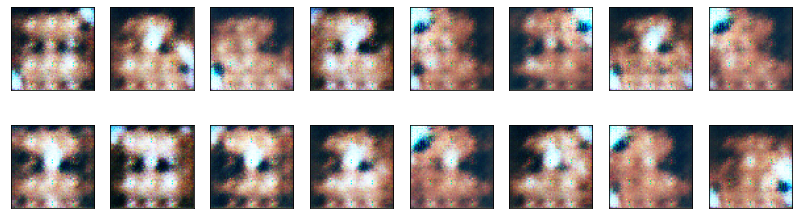

2023-11-27 18:08:40 | Epoch [2/50] | Batch 0/509 | d_loss: -118.6629 | g_loss: 66.9358
2023-11-27 18:08:48 | Epoch [2/50] | Batch 50/509 | d_loss: -94.2353 | g_loss: -41.2556
2023-11-27 18:08:56 | Epoch [2/50] | Batch 100/509 | d_loss: -116.7929 | g_loss: -5.5912
2023-11-27 18:09:04 | Epoch [2/50] | Batch 150/509 | d_loss: -90.3626 | g_loss: 11.7344
2023-11-27 18:09:12 | Epoch [2/50] | Batch 200/509 | d_loss: -74.2174 | g_loss: -110.5665
2023-11-27 18:09:21 | Epoch [2/50] | Batch 250/509 | d_loss: -80.7248 | g_loss: -74.4695
2023-11-27 18:09:29 | Epoch [2/50] | Batch 300/509 | d_loss: -82.5177 | g_loss: -121.8299
2023-11-27 18:09:37 | Epoch [2/50] | Batch 350/509 | d_loss: -69.4454 | g_loss: -142.6804
2023-11-27 18:09:46 | Epoch [2/50] | Batch 400/509 | d_loss: -102.7695 | g_loss: -29.0986
2023-11-27 18:09:54 | Epoch [2/50] | Batch 450/509 | d_loss: -81.3301 | g_loss: 33.4534
2023-11-27 18:10:02 | Epoch [2/50] | Batch 500/509 | d_loss: -75.0114 | g_loss: 37.4305


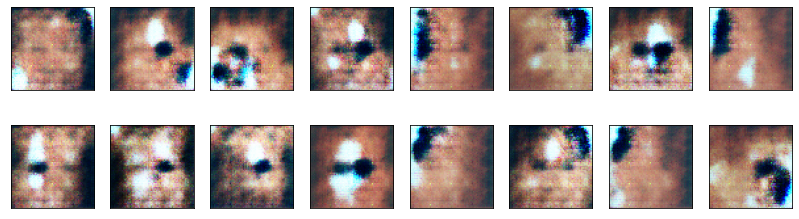

2023-11-27 18:10:07 | Epoch [3/50] | Batch 0/509 | d_loss: -82.7052 | g_loss: -26.9766
2023-11-27 18:10:16 | Epoch [3/50] | Batch 50/509 | d_loss: -70.4952 | g_loss: 34.6435
2023-11-27 18:10:24 | Epoch [3/50] | Batch 100/509 | d_loss: -61.1126 | g_loss: 253.3829
2023-11-27 18:10:32 | Epoch [3/50] | Batch 150/509 | d_loss: -90.5336 | g_loss: -37.7324
2023-11-27 18:10:40 | Epoch [3/50] | Batch 200/509 | d_loss: -78.2132 | g_loss: 137.3201
2023-11-27 18:10:48 | Epoch [3/50] | Batch 250/509 | d_loss: -64.7236 | g_loss: -2.7928
2023-11-27 18:10:56 | Epoch [3/50] | Batch 300/509 | d_loss: -72.1627 | g_loss: -9.4204
2023-11-27 18:11:04 | Epoch [3/50] | Batch 350/509 | d_loss: -82.4920 | g_loss: 14.2758
2023-11-27 18:11:12 | Epoch [3/50] | Batch 400/509 | d_loss: -75.0528 | g_loss: -49.3335
2023-11-27 18:11:20 | Epoch [3/50] | Batch 450/509 | d_loss: -72.0541 | g_loss: 129.0487
2023-11-27 18:11:28 | Epoch [3/50] | Batch 500/509 | d_loss: -75.8729 | g_loss: -45.7567


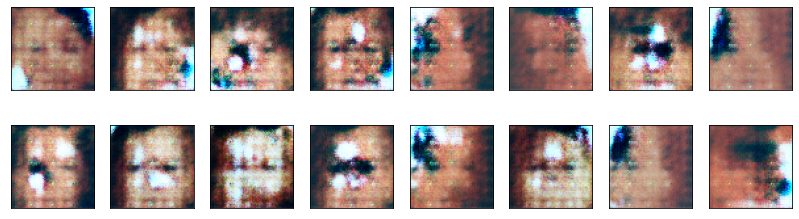

2023-11-27 18:11:33 | Epoch [4/50] | Batch 0/509 | d_loss: -96.9550 | g_loss: 88.4864
2023-11-27 18:11:41 | Epoch [4/50] | Batch 50/509 | d_loss: -66.8413 | g_loss: 74.2288
2023-11-27 18:11:50 | Epoch [4/50] | Batch 100/509 | d_loss: -97.0073 | g_loss: -96.3582
2023-11-27 18:11:58 | Epoch [4/50] | Batch 150/509 | d_loss: -101.7997 | g_loss: 5.1129
2023-11-27 18:12:06 | Epoch [4/50] | Batch 200/509 | d_loss: -57.9226 | g_loss: -62.8512
2023-11-27 18:12:15 | Epoch [4/50] | Batch 250/509 | d_loss: -77.4523 | g_loss: 84.4482
2023-11-27 18:12:22 | Epoch [4/50] | Batch 300/509 | d_loss: -58.6052 | g_loss: 28.0127
2023-11-27 18:12:30 | Epoch [4/50] | Batch 350/509 | d_loss: -61.2408 | g_loss: -62.1545
2023-11-27 18:12:38 | Epoch [4/50] | Batch 400/509 | d_loss: -94.6896 | g_loss: 0.5518
2023-11-27 18:12:46 | Epoch [4/50] | Batch 450/509 | d_loss: -64.7291 | g_loss: 96.7361
2023-11-27 18:12:54 | Epoch [4/50] | Batch 500/509 | d_loss: -80.8177 | g_loss: 53.1617


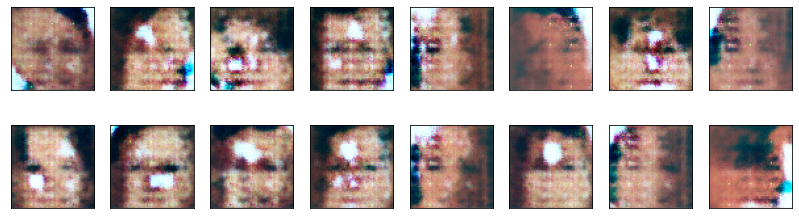

2023-11-27 18:12:59 | Epoch [5/50] | Batch 0/509 | d_loss: -73.8530 | g_loss: 1.0706
2023-11-27 18:13:07 | Epoch [5/50] | Batch 50/509 | d_loss: -75.8627 | g_loss: -34.9992
2023-11-27 18:13:15 | Epoch [5/50] | Batch 100/509 | d_loss: -47.2686 | g_loss: 111.7631
2023-11-27 18:13:24 | Epoch [5/50] | Batch 150/509 | d_loss: -78.5005 | g_loss: 8.8210
2023-11-27 18:13:32 | Epoch [5/50] | Batch 200/509 | d_loss: -74.6127 | g_loss: 23.3236
2023-11-27 18:13:40 | Epoch [5/50] | Batch 250/509 | d_loss: -73.9510 | g_loss: -8.7130
2023-11-27 18:13:49 | Epoch [5/50] | Batch 300/509 | d_loss: -95.5936 | g_loss: -30.8040
2023-11-27 18:13:57 | Epoch [5/50] | Batch 350/509 | d_loss: -111.1432 | g_loss: 38.1910
2023-11-27 18:14:05 | Epoch [5/50] | Batch 400/509 | d_loss: -82.7263 | g_loss: 44.8971
2023-11-27 18:14:13 | Epoch [5/50] | Batch 450/509 | d_loss: -93.3065 | g_loss: 127.9335
2023-11-27 18:14:22 | Epoch [5/50] | Batch 500/509 | d_loss: -68.0543 | g_loss: 37.2530


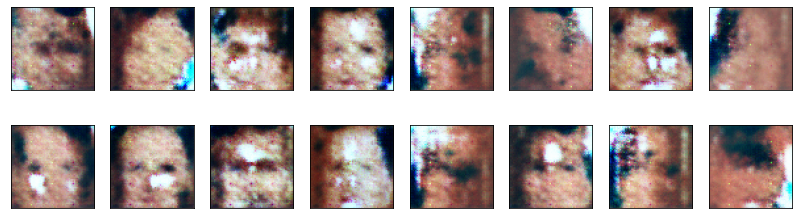

2023-11-27 18:14:26 | Epoch [6/50] | Batch 0/509 | d_loss: -71.3581 | g_loss: 28.9821
2023-11-27 18:14:34 | Epoch [6/50] | Batch 50/509 | d_loss: -80.8982 | g_loss: -23.5199
2023-11-27 18:14:43 | Epoch [6/50] | Batch 100/509 | d_loss: -74.0937 | g_loss: 23.6188
2023-11-27 18:14:51 | Epoch [6/50] | Batch 150/509 | d_loss: -70.3808 | g_loss: 92.9140
2023-11-27 18:14:59 | Epoch [6/50] | Batch 200/509 | d_loss: -81.4679 | g_loss: -11.8682
2023-11-27 18:15:07 | Epoch [6/50] | Batch 250/509 | d_loss: -100.9983 | g_loss: -12.5419
2023-11-27 18:15:15 | Epoch [6/50] | Batch 300/509 | d_loss: -73.6018 | g_loss: 55.0455
2023-11-27 18:15:23 | Epoch [6/50] | Batch 350/509 | d_loss: -92.4777 | g_loss: 85.2648
2023-11-27 18:15:32 | Epoch [6/50] | Batch 400/509 | d_loss: -78.4891 | g_loss: 105.4433
2023-11-27 18:15:40 | Epoch [6/50] | Batch 450/509 | d_loss: -84.4627 | g_loss: 104.5932
2023-11-27 18:15:48 | Epoch [6/50] | Batch 500/509 | d_loss: -83.8694 | g_loss: 53.4591


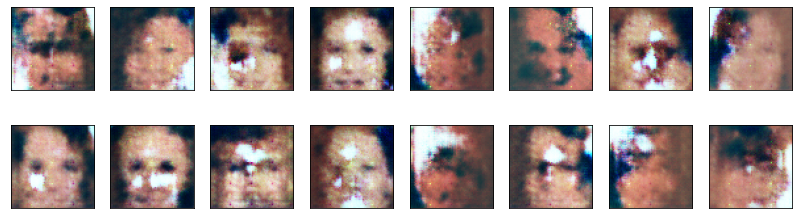

2023-11-27 18:15:54 | Epoch [7/50] | Batch 0/509 | d_loss: -91.8292 | g_loss: 42.1400
2023-11-27 18:16:02 | Epoch [7/50] | Batch 50/509 | d_loss: -73.5745 | g_loss: 49.3321
2023-11-27 18:16:10 | Epoch [7/50] | Batch 100/509 | d_loss: -100.8619 | g_loss: 9.4875
2023-11-27 18:16:18 | Epoch [7/50] | Batch 150/509 | d_loss: -77.7953 | g_loss: 92.7523
2023-11-27 18:16:26 | Epoch [7/50] | Batch 200/509 | d_loss: -59.0520 | g_loss: 61.6671
2023-11-27 18:16:34 | Epoch [7/50] | Batch 250/509 | d_loss: -109.3018 | g_loss: 21.7795
2023-11-27 18:16:43 | Epoch [7/50] | Batch 300/509 | d_loss: -93.2353 | g_loss: 78.5209
2023-11-27 18:16:51 | Epoch [7/50] | Batch 350/509 | d_loss: -92.9332 | g_loss: 29.3198
2023-11-27 18:16:59 | Epoch [7/50] | Batch 400/509 | d_loss: -87.5943 | g_loss: 37.3728
2023-11-27 18:17:07 | Epoch [7/50] | Batch 450/509 | d_loss: -89.2819 | g_loss: 12.5570
2023-11-27 18:17:15 | Epoch [7/50] | Batch 500/509 | d_loss: -88.2108 | g_loss: 70.6196


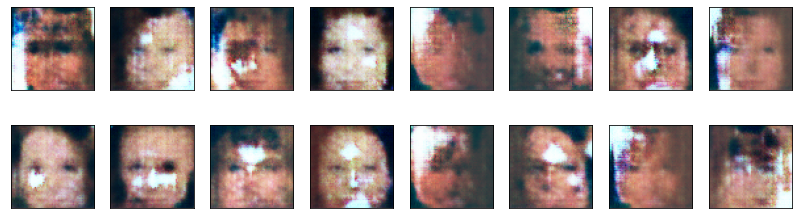

2023-11-27 18:17:20 | Epoch [8/50] | Batch 0/509 | d_loss: -61.9764 | g_loss: 81.1584
2023-11-27 18:17:28 | Epoch [8/50] | Batch 50/509 | d_loss: -94.3928 | g_loss: 90.2277
2023-11-27 18:17:36 | Epoch [8/50] | Batch 100/509 | d_loss: -93.9987 | g_loss: 31.3882
2023-11-27 18:17:45 | Epoch [8/50] | Batch 150/509 | d_loss: -82.0264 | g_loss: -29.1456
2023-11-27 18:17:53 | Epoch [8/50] | Batch 200/509 | d_loss: -76.9444 | g_loss: 76.7033
2023-11-27 18:18:01 | Epoch [8/50] | Batch 250/509 | d_loss: -77.2423 | g_loss: -37.1227
2023-11-27 18:18:09 | Epoch [8/50] | Batch 300/509 | d_loss: -95.4339 | g_loss: 102.4990
2023-11-27 18:18:17 | Epoch [8/50] | Batch 350/509 | d_loss: -103.2254 | g_loss: 94.5031
2023-11-27 18:18:25 | Epoch [8/50] | Batch 400/509 | d_loss: -97.2368 | g_loss: 4.9551
2023-11-27 18:18:33 | Epoch [8/50] | Batch 450/509 | d_loss: -114.5103 | g_loss: 57.5008
2023-11-27 18:18:41 | Epoch [8/50] | Batch 500/509 | d_loss: -101.7342 | g_loss: 79.9518


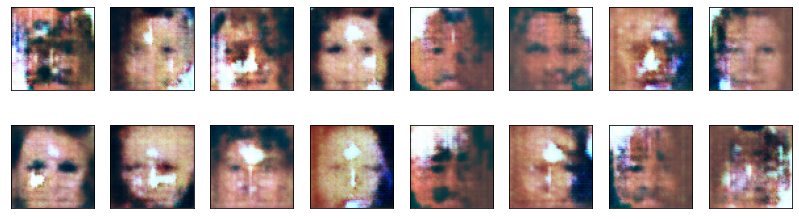

2023-11-27 18:18:47 | Epoch [9/50] | Batch 0/509 | d_loss: -101.5636 | g_loss: -7.6343
2023-11-27 18:18:55 | Epoch [9/50] | Batch 50/509 | d_loss: -106.0031 | g_loss: 14.1831
2023-11-27 18:19:03 | Epoch [9/50] | Batch 100/509 | d_loss: -110.3246 | g_loss: 22.6074
2023-11-27 18:19:11 | Epoch [9/50] | Batch 150/509 | d_loss: -110.3087 | g_loss: 5.0256
2023-11-27 18:19:19 | Epoch [9/50] | Batch 200/509 | d_loss: -81.2962 | g_loss: 65.3837
2023-11-27 18:19:28 | Epoch [9/50] | Batch 250/509 | d_loss: -108.8024 | g_loss: 46.7260
2023-11-27 18:19:36 | Epoch [9/50] | Batch 300/509 | d_loss: -96.7890 | g_loss: 62.2928
2023-11-27 18:19:44 | Epoch [9/50] | Batch 350/509 | d_loss: -125.7901 | g_loss: 68.6551
2023-11-27 18:19:52 | Epoch [9/50] | Batch 400/509 | d_loss: -121.3647 | g_loss: 64.5980
2023-11-27 18:20:01 | Epoch [9/50] | Batch 450/509 | d_loss: -95.2109 | g_loss: 49.0360
2023-11-27 18:20:09 | Epoch [9/50] | Batch 500/509 | d_loss: -107.7137 | g_loss: 14.9502


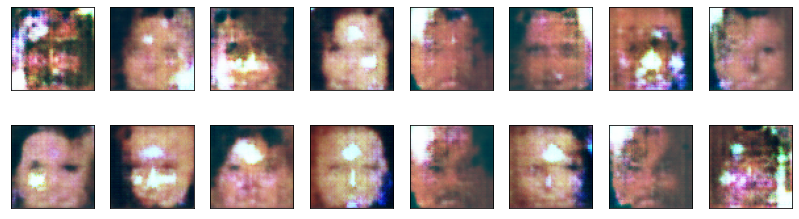

2023-11-27 18:20:15 | Epoch [10/50] | Batch 0/509 | d_loss: -113.0535 | g_loss: 131.7520
2023-11-27 18:20:23 | Epoch [10/50] | Batch 50/509 | d_loss: -97.0776 | g_loss: -30.1894
2023-11-27 18:20:30 | Epoch [10/50] | Batch 100/509 | d_loss: -94.4231 | g_loss: 68.8269
2023-11-27 18:20:39 | Epoch [10/50] | Batch 150/509 | d_loss: -124.6118 | g_loss: 24.0084
2023-11-27 18:20:47 | Epoch [10/50] | Batch 200/509 | d_loss: -78.2069 | g_loss: 96.6789
2023-11-27 18:20:55 | Epoch [10/50] | Batch 250/509 | d_loss: -79.6974 | g_loss: 121.3791
2023-11-27 18:21:03 | Epoch [10/50] | Batch 300/509 | d_loss: -121.9299 | g_loss: 56.3845
2023-11-27 18:21:11 | Epoch [10/50] | Batch 350/509 | d_loss: -97.1928 | g_loss: 23.0670
2023-11-27 18:21:19 | Epoch [10/50] | Batch 400/509 | d_loss: -140.4338 | g_loss: 19.4920
2023-11-27 18:21:27 | Epoch [10/50] | Batch 450/509 | d_loss: -99.5554 | g_loss: 9.2956
2023-11-27 18:21:36 | Epoch [10/50] | Batch 500/509 | d_loss: -82.1212 | g_loss: 105.0094


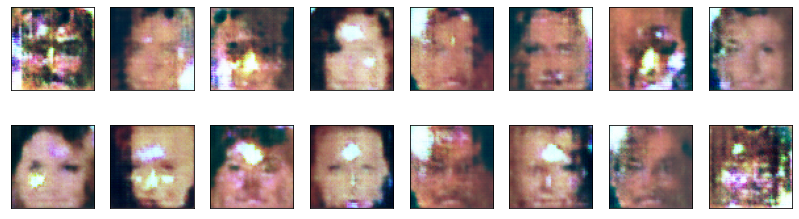

2023-11-27 18:21:41 | Epoch [11/50] | Batch 0/509 | d_loss: -79.8283 | g_loss: 61.0056
2023-11-27 18:21:50 | Epoch [11/50] | Batch 50/509 | d_loss: -76.1067 | g_loss: 61.9962
2023-11-27 18:21:58 | Epoch [11/50] | Batch 100/509 | d_loss: -130.1550 | g_loss: 63.4051
2023-11-27 18:22:06 | Epoch [11/50] | Batch 150/509 | d_loss: -66.3247 | g_loss: 75.6519
2023-11-27 18:22:15 | Epoch [11/50] | Batch 200/509 | d_loss: -66.9731 | g_loss: 38.7191
2023-11-27 18:22:23 | Epoch [11/50] | Batch 250/509 | d_loss: -85.3353 | g_loss: 31.0367
2023-11-27 18:22:31 | Epoch [11/50] | Batch 300/509 | d_loss: -96.7358 | g_loss: 51.8216
2023-11-27 18:22:39 | Epoch [11/50] | Batch 350/509 | d_loss: -103.1088 | g_loss: -0.7734
2023-11-27 18:22:47 | Epoch [11/50] | Batch 400/509 | d_loss: -123.7145 | g_loss: 53.7840
2023-11-27 18:22:55 | Epoch [11/50] | Batch 450/509 | d_loss: -115.4307 | g_loss: 37.6359
2023-11-27 18:23:02 | Epoch [11/50] | Batch 500/509 | d_loss: -91.8842 | g_loss: 128.5300


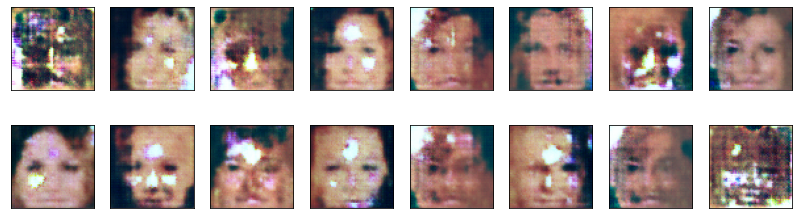

2023-11-27 18:23:07 | Epoch [12/50] | Batch 0/509 | d_loss: -69.8194 | g_loss: 61.2308
2023-11-27 18:23:16 | Epoch [12/50] | Batch 50/509 | d_loss: -76.4065 | g_loss: 80.4860
2023-11-27 18:23:24 | Epoch [12/50] | Batch 100/509 | d_loss: -95.3351 | g_loss: -3.0839
2023-11-27 18:23:32 | Epoch [12/50] | Batch 150/509 | d_loss: -75.0688 | g_loss: 26.9262
2023-11-27 18:23:41 | Epoch [12/50] | Batch 200/509 | d_loss: -115.4311 | g_loss: 44.2938
2023-11-27 18:23:49 | Epoch [12/50] | Batch 250/509 | d_loss: -106.7315 | g_loss: 18.3966
2023-11-27 18:23:57 | Epoch [12/50] | Batch 300/509 | d_loss: -79.6443 | g_loss: 44.3406
2023-11-27 18:24:06 | Epoch [12/50] | Batch 350/509 | d_loss: -109.9896 | g_loss: 29.2248
2023-11-27 18:24:14 | Epoch [12/50] | Batch 400/509 | d_loss: -93.1221 | g_loss: 6.1056
2023-11-27 18:24:22 | Epoch [12/50] | Batch 450/509 | d_loss: -93.9043 | g_loss: 60.5226
2023-11-27 18:24:29 | Epoch [12/50] | Batch 500/509 | d_loss: -109.5475 | g_loss: 76.9393


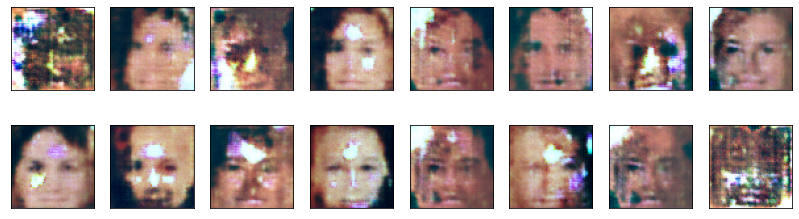

2023-11-27 18:24:34 | Epoch [13/50] | Batch 0/509 | d_loss: -84.4288 | g_loss: -41.6069
2023-11-27 18:24:42 | Epoch [13/50] | Batch 50/509 | d_loss: -102.0409 | g_loss: -3.2810
2023-11-27 18:24:50 | Epoch [13/50] | Batch 100/509 | d_loss: -96.9555 | g_loss: -10.3662
2023-11-27 18:24:58 | Epoch [13/50] | Batch 150/509 | d_loss: -107.9440 | g_loss: 43.3815
2023-11-27 18:25:06 | Epoch [13/50] | Batch 200/509 | d_loss: -79.2143 | g_loss: 1.3729
2023-11-27 18:25:14 | Epoch [13/50] | Batch 250/509 | d_loss: -91.4165 | g_loss: 33.5591
2023-11-27 18:25:23 | Epoch [13/50] | Batch 300/509 | d_loss: -87.7401 | g_loss: -2.5088
2023-11-27 18:25:31 | Epoch [13/50] | Batch 350/509 | d_loss: -91.0233 | g_loss: 39.4708
2023-11-27 18:25:39 | Epoch [13/50] | Batch 400/509 | d_loss: -81.1966 | g_loss: 69.0283
2023-11-27 18:25:48 | Epoch [13/50] | Batch 450/509 | d_loss: -76.7736 | g_loss: -24.4468
2023-11-27 18:25:56 | Epoch [13/50] | Batch 500/509 | d_loss: -108.0415 | g_loss: 14.1386


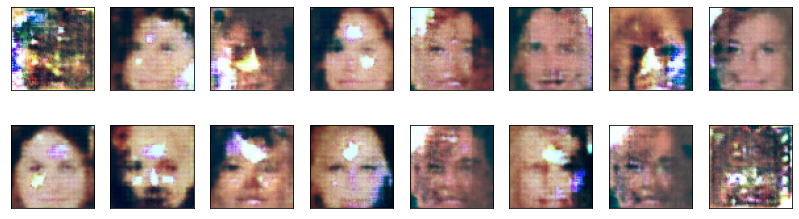

2023-11-27 18:26:02 | Epoch [14/50] | Batch 0/509 | d_loss: -127.7790 | g_loss: 19.2334
2023-11-27 18:26:10 | Epoch [14/50] | Batch 50/509 | d_loss: -103.6130 | g_loss: -3.5209
2023-11-27 18:26:18 | Epoch [14/50] | Batch 100/509 | d_loss: -114.3885 | g_loss: 22.6983
2023-11-27 18:26:26 | Epoch [14/50] | Batch 150/509 | d_loss: -105.0604 | g_loss: -1.2022
2023-11-27 18:26:34 | Epoch [14/50] | Batch 200/509 | d_loss: -84.6705 | g_loss: 21.8033
2023-11-27 18:26:43 | Epoch [14/50] | Batch 250/509 | d_loss: -102.7411 | g_loss: 76.9362
2023-11-27 18:26:51 | Epoch [14/50] | Batch 300/509 | d_loss: -96.6324 | g_loss: -6.5850
2023-11-27 18:26:59 | Epoch [14/50] | Batch 350/509 | d_loss: -94.8364 | g_loss: 6.4472
2023-11-27 18:27:07 | Epoch [14/50] | Batch 400/509 | d_loss: -93.8843 | g_loss: 6.1352
2023-11-27 18:27:15 | Epoch [14/50] | Batch 450/509 | d_loss: -98.0398 | g_loss: -7.5449
2023-11-27 18:27:23 | Epoch [14/50] | Batch 500/509 | d_loss: -101.8215 | g_loss: 36.7086


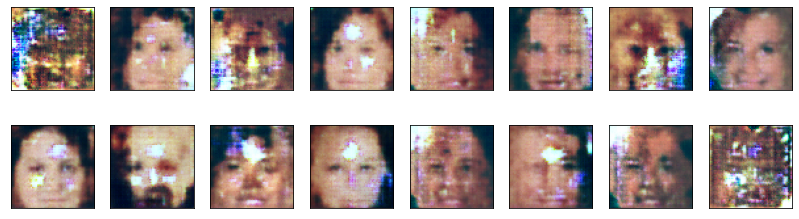

2023-11-27 18:27:29 | Epoch [15/50] | Batch 0/509 | d_loss: -100.9731 | g_loss: 3.2545
2023-11-27 18:27:37 | Epoch [15/50] | Batch 50/509 | d_loss: -89.4736 | g_loss: 87.4890
2023-11-27 18:27:46 | Epoch [15/50] | Batch 100/509 | d_loss: -144.6339 | g_loss: -8.2639
2023-11-27 18:27:54 | Epoch [15/50] | Batch 150/509 | d_loss: -92.6710 | g_loss: -4.0517
2023-11-27 18:28:02 | Epoch [15/50] | Batch 200/509 | d_loss: -78.0389 | g_loss: -8.7950
2023-11-27 18:28:11 | Epoch [15/50] | Batch 250/509 | d_loss: -101.2757 | g_loss: -35.6060
2023-11-27 18:28:19 | Epoch [15/50] | Batch 300/509 | d_loss: -62.4545 | g_loss: 1.7776
2023-11-27 18:28:27 | Epoch [15/50] | Batch 350/509 | d_loss: -82.2042 | g_loss: -7.7454
2023-11-27 18:28:35 | Epoch [15/50] | Batch 400/509 | d_loss: -84.3847 | g_loss: -19.6266
2023-11-27 18:28:43 | Epoch [15/50] | Batch 450/509 | d_loss: -129.1754 | g_loss: 20.1555
2023-11-27 18:28:51 | Epoch [15/50] | Batch 500/509 | d_loss: -85.7848 | g_loss: -15.7747


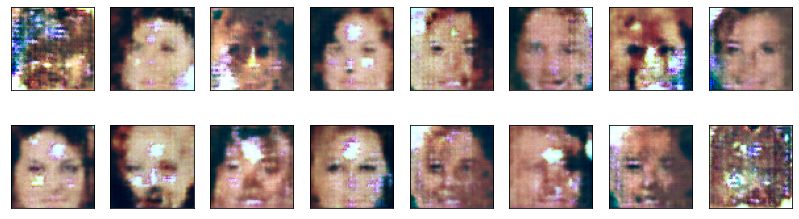

2023-11-27 18:28:57 | Epoch [16/50] | Batch 0/509 | d_loss: -82.8904 | g_loss: -21.3164
2023-11-27 18:29:04 | Epoch [16/50] | Batch 50/509 | d_loss: -93.0132 | g_loss: -30.0615
2023-11-27 18:29:13 | Epoch [16/50] | Batch 100/509 | d_loss: -103.1983 | g_loss: -69.7211
2023-11-27 18:29:21 | Epoch [16/50] | Batch 150/509 | d_loss: -80.4178 | g_loss: 1.2763
2023-11-27 18:29:29 | Epoch [16/50] | Batch 200/509 | d_loss: -121.7903 | g_loss: -8.0894
2023-11-27 18:29:38 | Epoch [16/50] | Batch 250/509 | d_loss: -65.7318 | g_loss: -55.0288
2023-11-27 18:29:46 | Epoch [16/50] | Batch 300/509 | d_loss: -99.1340 | g_loss: 14.2103
2023-11-27 18:29:54 | Epoch [16/50] | Batch 350/509 | d_loss: -95.8216 | g_loss: 1.6860
2023-11-27 18:30:02 | Epoch [16/50] | Batch 400/509 | d_loss: -96.0114 | g_loss: 5.7540
2023-11-27 18:30:11 | Epoch [16/50] | Batch 450/509 | d_loss: -82.3789 | g_loss: -43.1706
2023-11-27 18:30:19 | Epoch [16/50] | Batch 500/509 | d_loss: -91.5995 | g_loss: -13.7192


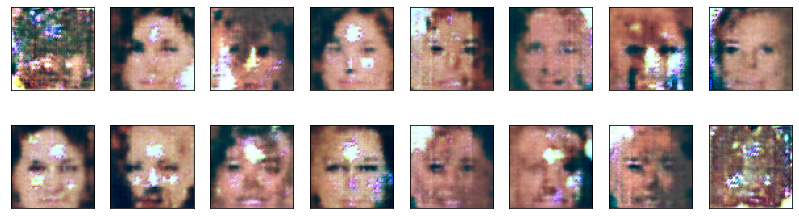

2023-11-27 18:30:25 | Epoch [17/50] | Batch 0/509 | d_loss: -79.4290 | g_loss: -29.8878
2023-11-27 18:30:32 | Epoch [17/50] | Batch 50/509 | d_loss: -86.0678 | g_loss: -18.0239
2023-11-27 18:30:41 | Epoch [17/50] | Batch 100/509 | d_loss: -73.4830 | g_loss: -53.1891
2023-11-27 18:30:49 | Epoch [17/50] | Batch 150/509 | d_loss: -98.1933 | g_loss: -49.3399
2023-11-27 18:30:57 | Epoch [17/50] | Batch 200/509 | d_loss: -86.3065 | g_loss: -20.3310
2023-11-27 18:31:05 | Epoch [17/50] | Batch 250/509 | d_loss: -100.6134 | g_loss: -31.3327
2023-11-27 18:31:13 | Epoch [17/50] | Batch 300/509 | d_loss: -93.4113 | g_loss: -61.0374
2023-11-27 18:31:21 | Epoch [17/50] | Batch 350/509 | d_loss: -88.3352 | g_loss: 9.0314
2023-11-27 18:31:29 | Epoch [17/50] | Batch 400/509 | d_loss: -115.6540 | g_loss: -45.9427
2023-11-27 18:31:38 | Epoch [17/50] | Batch 450/509 | d_loss: -109.6594 | g_loss: -42.1447
2023-11-27 18:31:46 | Epoch [17/50] | Batch 500/509 | d_loss: -76.7744 | g_loss: -62.9724


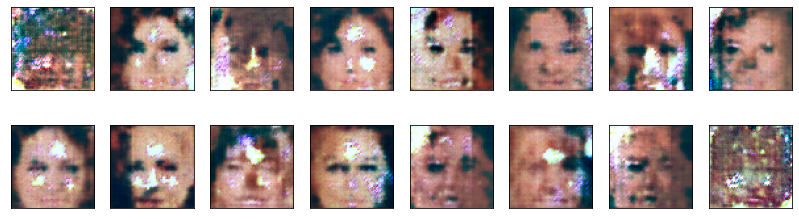

2023-11-27 18:31:51 | Epoch [18/50] | Batch 0/509 | d_loss: -99.0695 | g_loss: -42.6781
2023-11-27 18:32:00 | Epoch [18/50] | Batch 50/509 | d_loss: -112.6574 | g_loss: -43.1040
2023-11-27 18:32:08 | Epoch [18/50] | Batch 100/509 | d_loss: -72.8867 | g_loss: -61.9310
2023-11-27 18:32:16 | Epoch [18/50] | Batch 150/509 | d_loss: -98.0312 | g_loss: -51.3505
2023-11-27 18:32:25 | Epoch [18/50] | Batch 200/509 | d_loss: -124.2972 | g_loss: -49.8502
2023-11-27 18:32:33 | Epoch [18/50] | Batch 250/509 | d_loss: -99.3655 | g_loss: -94.9771
2023-11-27 18:32:41 | Epoch [18/50] | Batch 300/509 | d_loss: -105.3617 | g_loss: -114.2601
2023-11-27 18:32:49 | Epoch [18/50] | Batch 350/509 | d_loss: -78.1058 | g_loss: -125.5496
2023-11-27 18:32:57 | Epoch [18/50] | Batch 400/509 | d_loss: -75.1975 | g_loss: -115.7354
2023-11-27 18:33:05 | Epoch [18/50] | Batch 450/509 | d_loss: -70.5979 | g_loss: -102.7618
2023-11-27 18:33:13 | Epoch [18/50] | Batch 500/509 | d_loss: -110.1567 | g_loss: -127.0435


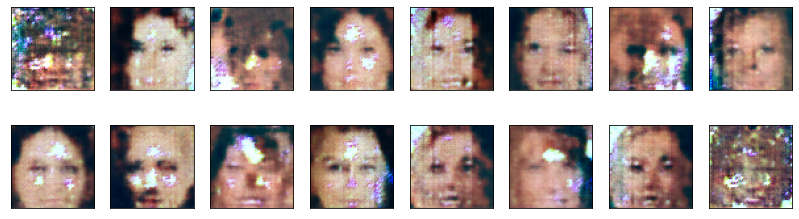

2023-11-27 18:33:19 | Epoch [19/50] | Batch 0/509 | d_loss: -78.9673 | g_loss: -170.3070
2023-11-27 18:33:27 | Epoch [19/50] | Batch 50/509 | d_loss: -101.1900 | g_loss: -142.0927
2023-11-27 18:33:35 | Epoch [19/50] | Batch 100/509 | d_loss: -93.1592 | g_loss: -111.9454
2023-11-27 18:33:43 | Epoch [19/50] | Batch 150/509 | d_loss: -98.1516 | g_loss: -135.2828
2023-11-27 18:33:51 | Epoch [19/50] | Batch 200/509 | d_loss: -108.5320 | g_loss: -152.6613
2023-11-27 18:34:00 | Epoch [19/50] | Batch 250/509 | d_loss: -92.3489 | g_loss: -90.1174
2023-11-27 18:34:08 | Epoch [19/50] | Batch 300/509 | d_loss: -82.6279 | g_loss: -70.6401
2023-11-27 18:34:16 | Epoch [19/50] | Batch 350/509 | d_loss: -96.7694 | g_loss: -163.5863
2023-11-27 18:34:25 | Epoch [19/50] | Batch 400/509 | d_loss: -98.1221 | g_loss: -127.4539
2023-11-27 18:34:33 | Epoch [19/50] | Batch 450/509 | d_loss: -96.4126 | g_loss: -129.9021
2023-11-27 18:34:41 | Epoch [19/50] | Batch 500/509 | d_loss: -104.6061 | g_loss: -134.5510


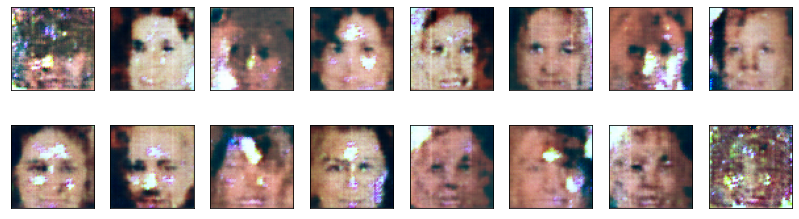

2023-11-27 18:34:46 | Epoch [20/50] | Batch 0/509 | d_loss: -74.8162 | g_loss: -170.6832
2023-11-27 18:34:54 | Epoch [20/50] | Batch 50/509 | d_loss: -69.0187 | g_loss: -101.0253
2023-11-27 18:35:03 | Epoch [20/50] | Batch 100/509 | d_loss: -72.5404 | g_loss: -107.7448
2023-11-27 18:35:11 | Epoch [20/50] | Batch 150/509 | d_loss: -111.8807 | g_loss: -94.2486
2023-11-27 18:35:19 | Epoch [20/50] | Batch 200/509 | d_loss: -97.3888 | g_loss: -103.9229
2023-11-27 18:35:27 | Epoch [20/50] | Batch 250/509 | d_loss: -124.6622 | g_loss: -73.8394
2023-11-27 18:35:35 | Epoch [20/50] | Batch 300/509 | d_loss: -118.5177 | g_loss: -102.2840
2023-11-27 18:35:43 | Epoch [20/50] | Batch 350/509 | d_loss: -80.7608 | g_loss: -53.3362
2023-11-27 18:35:52 | Epoch [20/50] | Batch 400/509 | d_loss: -84.1113 | g_loss: -113.6328
2023-11-27 18:36:00 | Epoch [20/50] | Batch 450/509 | d_loss: -50.2156 | g_loss: -85.3071
2023-11-27 18:36:08 | Epoch [20/50] | Batch 500/509 | d_loss: -86.8845 | g_loss: -145.0020


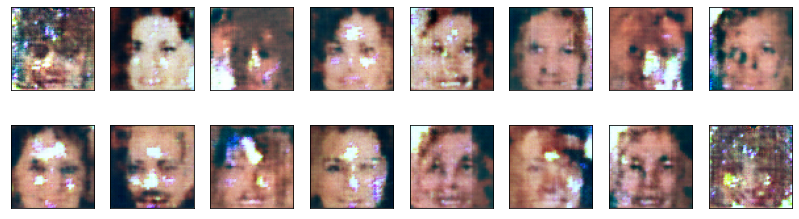

2023-11-27 18:36:14 | Epoch [21/50] | Batch 0/509 | d_loss: -95.2986 | g_loss: -112.8397
2023-11-27 18:36:23 | Epoch [21/50] | Batch 50/509 | d_loss: -91.5800 | g_loss: -122.7654
2023-11-27 18:36:31 | Epoch [21/50] | Batch 100/509 | d_loss: -101.9989 | g_loss: -103.4448
2023-11-27 18:36:40 | Epoch [21/50] | Batch 150/509 | d_loss: -83.9024 | g_loss: -136.6979
2023-11-27 18:36:48 | Epoch [21/50] | Batch 200/509 | d_loss: -112.5994 | g_loss: -142.1621
2023-11-27 18:36:56 | Epoch [21/50] | Batch 250/509 | d_loss: -67.6901 | g_loss: -138.4784
2023-11-27 18:37:04 | Epoch [21/50] | Batch 300/509 | d_loss: -105.2599 | g_loss: -183.7606
2023-11-27 18:37:12 | Epoch [21/50] | Batch 350/509 | d_loss: -82.9874 | g_loss: -145.3259
2023-11-27 18:37:20 | Epoch [21/50] | Batch 400/509 | d_loss: -61.6652 | g_loss: -168.7125
2023-11-27 18:37:28 | Epoch [21/50] | Batch 450/509 | d_loss: -89.8390 | g_loss: -162.5334
2023-11-27 18:37:36 | Epoch [21/50] | Batch 500/509 | d_loss: -83.9694 | g_loss: -171.4026

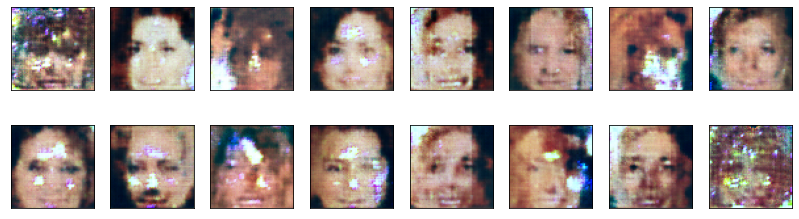

2023-11-27 18:37:41 | Epoch [22/50] | Batch 0/509 | d_loss: -85.8433 | g_loss: -150.5574
2023-11-27 18:37:50 | Epoch [22/50] | Batch 50/509 | d_loss: -80.8047 | g_loss: -115.3156
2023-11-27 18:37:58 | Epoch [22/50] | Batch 100/509 | d_loss: -76.0643 | g_loss: -177.3377
2023-11-27 18:38:06 | Epoch [22/50] | Batch 150/509 | d_loss: -102.5249 | g_loss: -130.2220
2023-11-27 18:38:15 | Epoch [22/50] | Batch 200/509 | d_loss: -93.7706 | g_loss: -147.9182
2023-11-27 18:38:23 | Epoch [22/50] | Batch 250/509 | d_loss: -93.9931 | g_loss: -175.9836
2023-11-27 18:38:31 | Epoch [22/50] | Batch 300/509 | d_loss: -89.1607 | g_loss: -172.4921
2023-11-27 18:38:40 | Epoch [22/50] | Batch 350/509 | d_loss: -89.3954 | g_loss: -207.5251
2023-11-27 18:38:48 | Epoch [22/50] | Batch 400/509 | d_loss: -99.5956 | g_loss: -175.4122
2023-11-27 18:38:56 | Epoch [22/50] | Batch 450/509 | d_loss: -84.6553 | g_loss: -208.5621
2023-11-27 18:39:04 | Epoch [22/50] | Batch 500/509 | d_loss: -92.9638 | g_loss: -167.7406


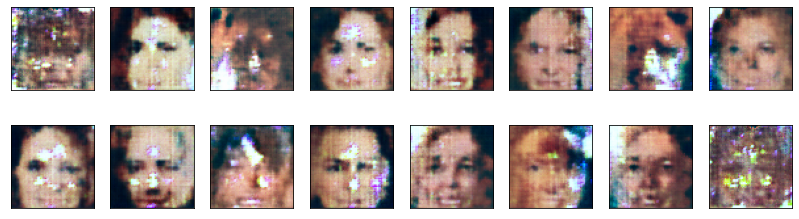

2023-11-27 18:39:09 | Epoch [23/50] | Batch 0/509 | d_loss: -120.4737 | g_loss: -186.5487
2023-11-27 18:39:17 | Epoch [23/50] | Batch 50/509 | d_loss: -85.3038 | g_loss: -176.6367
2023-11-27 18:39:25 | Epoch [23/50] | Batch 100/509 | d_loss: -79.9258 | g_loss: -190.9243
2023-11-27 18:39:33 | Epoch [23/50] | Batch 150/509 | d_loss: -106.1408 | g_loss: -197.3306
2023-11-27 18:39:42 | Epoch [23/50] | Batch 200/509 | d_loss: -98.5923 | g_loss: -268.6470
2023-11-27 18:39:50 | Epoch [23/50] | Batch 250/509 | d_loss: -99.4667 | g_loss: -171.0092
2023-11-27 18:39:58 | Epoch [23/50] | Batch 300/509 | d_loss: -71.7389 | g_loss: -211.9023
2023-11-27 18:40:07 | Epoch [23/50] | Batch 350/509 | d_loss: -120.7114 | g_loss: -143.3389
2023-11-27 18:40:15 | Epoch [23/50] | Batch 400/509 | d_loss: -124.1778 | g_loss: -163.0033
2023-11-27 18:40:23 | Epoch [23/50] | Batch 450/509 | d_loss: -54.3741 | g_loss: -139.7397
2023-11-27 18:40:31 | Epoch [23/50] | Batch 500/509 | d_loss: -112.7567 | g_loss: -199.13

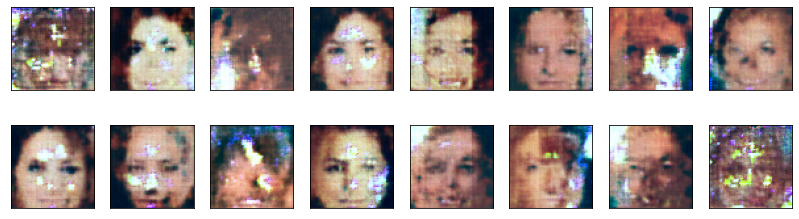

2023-11-27 18:40:38 | Epoch [24/50] | Batch 0/509 | d_loss: -84.4284 | g_loss: -133.8988
2023-11-27 18:40:46 | Epoch [24/50] | Batch 50/509 | d_loss: -80.6827 | g_loss: -162.6095
2023-11-27 18:40:54 | Epoch [24/50] | Batch 100/509 | d_loss: -94.0207 | g_loss: -158.6654
2023-11-27 18:41:02 | Epoch [24/50] | Batch 150/509 | d_loss: -117.3263 | g_loss: -101.6330
2023-11-27 18:41:10 | Epoch [24/50] | Batch 200/509 | d_loss: -93.7271 | g_loss: -92.1693
2023-11-27 18:41:18 | Epoch [24/50] | Batch 250/509 | d_loss: -71.0724 | g_loss: -101.6311
2023-11-27 18:41:26 | Epoch [24/50] | Batch 300/509 | d_loss: -115.7132 | g_loss: -121.1294
2023-11-27 18:41:34 | Epoch [24/50] | Batch 350/509 | d_loss: -85.7620 | g_loss: -94.7011
2023-11-27 18:41:42 | Epoch [24/50] | Batch 400/509 | d_loss: -89.3713 | g_loss: -140.4429
2023-11-27 18:41:51 | Epoch [24/50] | Batch 450/509 | d_loss: -119.0618 | g_loss: -150.1647
2023-11-27 18:41:59 | Epoch [24/50] | Batch 500/509 | d_loss: -92.3407 | g_loss: -170.1833


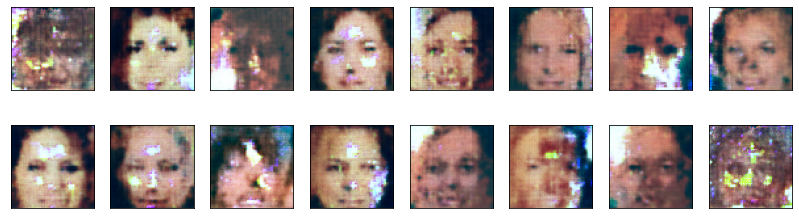

2023-11-27 18:42:05 | Epoch [25/50] | Batch 0/509 | d_loss: -117.5416 | g_loss: -158.7873
2023-11-27 18:42:13 | Epoch [25/50] | Batch 50/509 | d_loss: -85.3871 | g_loss: -145.3056
2023-11-27 18:42:22 | Epoch [25/50] | Batch 100/509 | d_loss: -111.8814 | g_loss: -82.1018
2023-11-27 18:42:30 | Epoch [25/50] | Batch 150/509 | d_loss: -84.7142 | g_loss: -144.5322
2023-11-27 18:42:38 | Epoch [25/50] | Batch 200/509 | d_loss: -64.3262 | g_loss: -168.3879
2023-11-27 18:42:47 | Epoch [25/50] | Batch 250/509 | d_loss: -72.3025 | g_loss: -121.2231
2023-11-27 18:42:55 | Epoch [25/50] | Batch 300/509 | d_loss: -76.6618 | g_loss: -105.9615
2023-11-27 18:43:03 | Epoch [25/50] | Batch 350/509 | d_loss: -90.9545 | g_loss: -106.7311
2023-11-27 18:43:11 | Epoch [25/50] | Batch 400/509 | d_loss: -111.1532 | g_loss: -104.5826
2023-11-27 18:43:19 | Epoch [25/50] | Batch 450/509 | d_loss: -88.9844 | g_loss: -106.1804
2023-11-27 18:43:27 | Epoch [25/50] | Batch 500/509 | d_loss: -108.2330 | g_loss: -35.2429


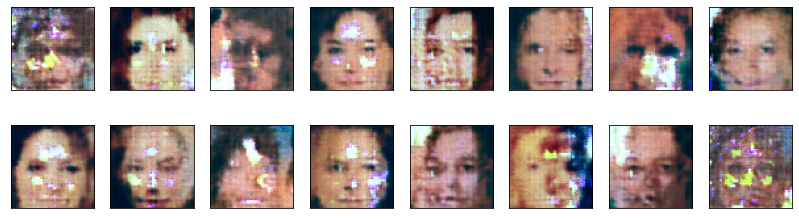

2023-11-27 18:43:32 | Epoch [26/50] | Batch 0/509 | d_loss: -102.8564 | g_loss: -135.4471
2023-11-27 18:43:40 | Epoch [26/50] | Batch 50/509 | d_loss: -91.3504 | g_loss: -89.4972
2023-11-27 18:43:48 | Epoch [26/50] | Batch 100/509 | d_loss: -89.1705 | g_loss: -70.8437
2023-11-27 18:43:57 | Epoch [26/50] | Batch 150/509 | d_loss: -118.5487 | g_loss: -104.8990
2023-11-27 18:44:05 | Epoch [26/50] | Batch 200/509 | d_loss: -83.9488 | g_loss: -153.2168
2023-11-27 18:44:13 | Epoch [26/50] | Batch 250/509 | d_loss: -88.5767 | g_loss: -114.4316
2023-11-27 18:44:21 | Epoch [26/50] | Batch 300/509 | d_loss: -90.0521 | g_loss: -99.6140
2023-11-27 18:44:30 | Epoch [26/50] | Batch 350/509 | d_loss: -124.1701 | g_loss: -140.2200
2023-11-27 18:44:38 | Epoch [26/50] | Batch 400/509 | d_loss: -89.7996 | g_loss: -123.5429
2023-11-27 18:44:46 | Epoch [26/50] | Batch 450/509 | d_loss: -80.8963 | g_loss: -110.3129
2023-11-27 18:44:54 | Epoch [26/50] | Batch 500/509 | d_loss: -93.4273 | g_loss: -125.2241


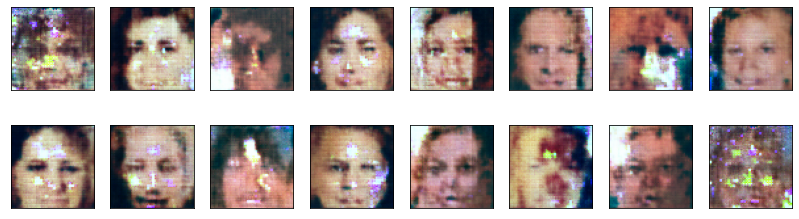

2023-11-27 18:45:00 | Epoch [27/50] | Batch 0/509 | d_loss: -95.3494 | g_loss: -116.4887
2023-11-27 18:45:08 | Epoch [27/50] | Batch 50/509 | d_loss: -88.6561 | g_loss: -106.2516
2023-11-27 18:45:16 | Epoch [27/50] | Batch 100/509 | d_loss: -103.7659 | g_loss: -86.0377
2023-11-27 18:45:24 | Epoch [27/50] | Batch 150/509 | d_loss: -117.7910 | g_loss: -136.8353
2023-11-27 18:45:32 | Epoch [27/50] | Batch 200/509 | d_loss: -94.7061 | g_loss: -155.2266
2023-11-27 18:45:40 | Epoch [27/50] | Batch 250/509 | d_loss: -89.6937 | g_loss: -112.3961
2023-11-27 18:45:48 | Epoch [27/50] | Batch 300/509 | d_loss: -64.6648 | g_loss: -148.9050
2023-11-27 18:45:57 | Epoch [27/50] | Batch 350/509 | d_loss: -130.7229 | g_loss: -62.0467
2023-11-27 18:46:05 | Epoch [27/50] | Batch 400/509 | d_loss: -69.0857 | g_loss: -164.0264
2023-11-27 18:46:13 | Epoch [27/50] | Batch 450/509 | d_loss: -114.4386 | g_loss: -123.8732
2023-11-27 18:46:21 | Epoch [27/50] | Batch 500/509 | d_loss: -77.4751 | g_loss: -180.3843


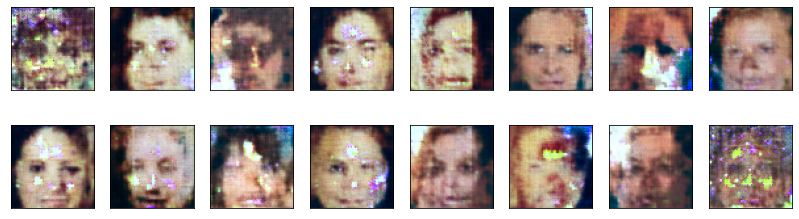

2023-11-27 18:46:26 | Epoch [28/50] | Batch 0/509 | d_loss: -88.3840 | g_loss: -103.7372
2023-11-27 18:46:35 | Epoch [28/50] | Batch 50/509 | d_loss: -115.5193 | g_loss: -193.2598
2023-11-27 18:46:43 | Epoch [28/50] | Batch 100/509 | d_loss: -76.1314 | g_loss: -68.5718
2023-11-27 18:46:51 | Epoch [28/50] | Batch 150/509 | d_loss: -70.8571 | g_loss: -161.5595
2023-11-27 18:46:59 | Epoch [28/50] | Batch 200/509 | d_loss: -96.2817 | g_loss: -102.8595
2023-11-27 18:47:07 | Epoch [28/50] | Batch 250/509 | d_loss: -99.4749 | g_loss: -122.6499
2023-11-27 18:47:15 | Epoch [28/50] | Batch 300/509 | d_loss: -84.9432 | g_loss: -97.2949
2023-11-27 18:47:22 | Epoch [28/50] | Batch 350/509 | d_loss: -126.3361 | g_loss: -106.6606
2023-11-27 18:47:30 | Epoch [28/50] | Batch 400/509 | d_loss: -120.0639 | g_loss: -149.0876
2023-11-27 18:47:38 | Epoch [28/50] | Batch 450/509 | d_loss: -82.5054 | g_loss: -151.6138
2023-11-27 18:47:46 | Epoch [28/50] | Batch 500/509 | d_loss: -93.9809 | g_loss: -121.8027


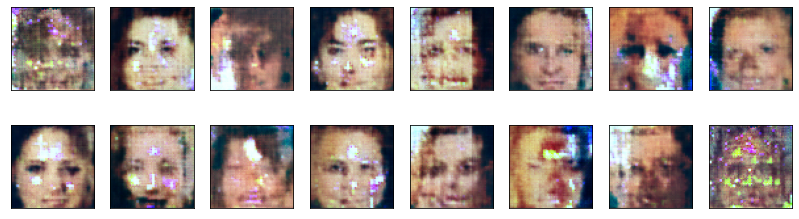

2023-11-27 18:47:51 | Epoch [29/50] | Batch 0/509 | d_loss: -87.0018 | g_loss: -133.3075
2023-11-27 18:47:59 | Epoch [29/50] | Batch 50/509 | d_loss: -80.1111 | g_loss: -182.4559
2023-11-27 18:48:07 | Epoch [29/50] | Batch 100/509 | d_loss: -90.7554 | g_loss: -150.0074
2023-11-27 18:48:15 | Epoch [29/50] | Batch 150/509 | d_loss: -83.8441 | g_loss: -162.3645
2023-11-27 18:48:23 | Epoch [29/50] | Batch 200/509 | d_loss: -72.8228 | g_loss: -124.8887
2023-11-27 18:48:31 | Epoch [29/50] | Batch 250/509 | d_loss: -105.1916 | g_loss: -189.0592
2023-11-27 18:48:39 | Epoch [29/50] | Batch 300/509 | d_loss: -102.1012 | g_loss: -97.7881
2023-11-27 18:48:47 | Epoch [29/50] | Batch 350/509 | d_loss: -99.7507 | g_loss: -151.0492
2023-11-27 18:48:54 | Epoch [29/50] | Batch 400/509 | d_loss: -100.9724 | g_loss: -170.8623
2023-11-27 18:49:02 | Epoch [29/50] | Batch 450/509 | d_loss: -81.5043 | g_loss: -143.6592
2023-11-27 18:49:10 | Epoch [29/50] | Batch 500/509 | d_loss: -89.4574 | g_loss: -149.1069


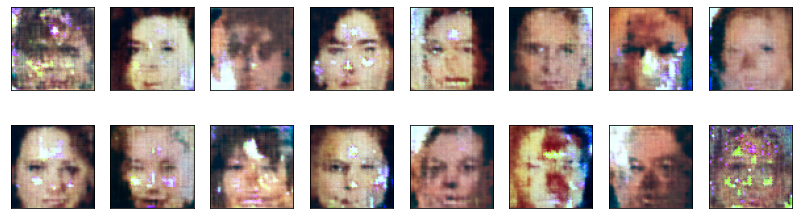

2023-11-27 18:49:15 | Epoch [30/50] | Batch 0/509 | d_loss: -99.7597 | g_loss: -168.2729
2023-11-27 18:49:23 | Epoch [30/50] | Batch 50/509 | d_loss: -100.6842 | g_loss: -146.3416
2023-11-27 18:49:30 | Epoch [30/50] | Batch 100/509 | d_loss: -97.1501 | g_loss: -192.9025
2023-11-27 18:49:38 | Epoch [30/50] | Batch 150/509 | d_loss: -91.2173 | g_loss: -117.6149
2023-11-27 18:49:46 | Epoch [30/50] | Batch 200/509 | d_loss: -122.4079 | g_loss: -105.6079
2023-11-27 18:49:54 | Epoch [30/50] | Batch 250/509 | d_loss: -102.0917 | g_loss: -119.1802
2023-11-27 18:50:02 | Epoch [30/50] | Batch 300/509 | d_loss: -97.7199 | g_loss: -120.9571
2023-11-27 18:50:10 | Epoch [30/50] | Batch 350/509 | d_loss: -96.6725 | g_loss: -67.1431
2023-11-27 18:50:17 | Epoch [30/50] | Batch 400/509 | d_loss: -94.9795 | g_loss: -114.6208
2023-11-27 18:50:25 | Epoch [30/50] | Batch 450/509 | d_loss: -110.6294 | g_loss: -113.6358
2023-11-27 18:50:33 | Epoch [30/50] | Batch 500/509 | d_loss: -94.1422 | g_loss: -73.7504


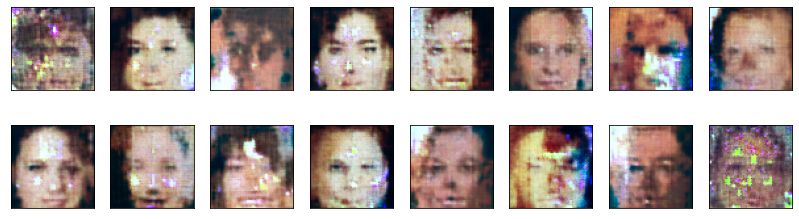

2023-11-27 18:50:38 | Epoch [31/50] | Batch 0/509 | d_loss: -84.2409 | g_loss: -127.8593
2023-11-27 18:50:46 | Epoch [31/50] | Batch 50/509 | d_loss: -63.3923 | g_loss: -79.9337
2023-11-27 18:50:54 | Epoch [31/50] | Batch 100/509 | d_loss: -83.9683 | g_loss: -175.0240
2023-11-27 18:51:02 | Epoch [31/50] | Batch 150/509 | d_loss: -88.5325 | g_loss: -130.9617
2023-11-27 18:51:10 | Epoch [31/50] | Batch 200/509 | d_loss: -72.9714 | g_loss: -168.2755
2023-11-27 18:51:17 | Epoch [31/50] | Batch 250/509 | d_loss: -116.5344 | g_loss: -125.2885
2023-11-27 18:51:25 | Epoch [31/50] | Batch 300/509 | d_loss: -109.9967 | g_loss: -183.9738
2023-11-27 18:51:33 | Epoch [31/50] | Batch 350/509 | d_loss: -106.5244 | g_loss: -139.4962
2023-11-27 18:51:41 | Epoch [31/50] | Batch 400/509 | d_loss: -103.5125 | g_loss: -147.5426
2023-11-27 18:51:49 | Epoch [31/50] | Batch 450/509 | d_loss: -119.6956 | g_loss: -111.3307
2023-11-27 18:51:56 | Epoch [31/50] | Batch 500/509 | d_loss: -98.9420 | g_loss: -150.642

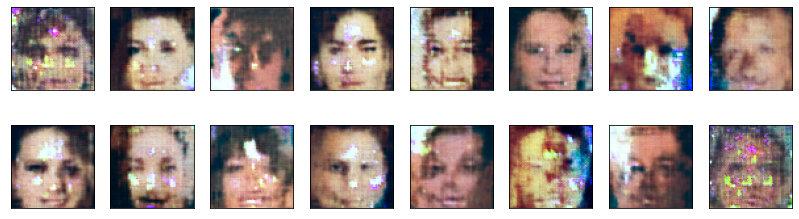

2023-11-27 18:52:01 | Epoch [32/50] | Batch 0/509 | d_loss: -109.2186 | g_loss: -116.7456
2023-11-27 18:52:09 | Epoch [32/50] | Batch 50/509 | d_loss: -101.7220 | g_loss: -133.5157
2023-11-27 18:52:16 | Epoch [32/50] | Batch 100/509 | d_loss: -74.7402 | g_loss: -87.2646
2023-11-27 18:52:24 | Epoch [32/50] | Batch 150/509 | d_loss: -115.3538 | g_loss: -98.3713
2023-11-27 18:52:32 | Epoch [32/50] | Batch 200/509 | d_loss: -104.5214 | g_loss: -107.9810
2023-11-27 18:52:40 | Epoch [32/50] | Batch 250/509 | d_loss: -128.4620 | g_loss: -130.7890
2023-11-27 18:52:48 | Epoch [32/50] | Batch 300/509 | d_loss: -67.7739 | g_loss: -95.8313
2023-11-27 18:52:56 | Epoch [32/50] | Batch 350/509 | d_loss: -75.9895 | g_loss: -129.6267
2023-11-27 18:53:04 | Epoch [32/50] | Batch 400/509 | d_loss: -71.7299 | g_loss: -124.8179
2023-11-27 18:53:12 | Epoch [32/50] | Batch 450/509 | d_loss: -81.9549 | g_loss: -98.9399
2023-11-27 18:53:19 | Epoch [32/50] | Batch 500/509 | d_loss: -84.7249 | g_loss: -138.1598


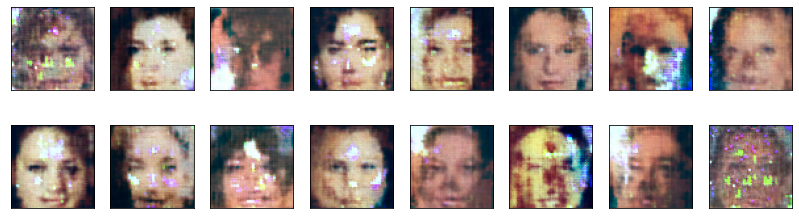

2023-11-27 18:53:25 | Epoch [33/50] | Batch 0/509 | d_loss: -96.9027 | g_loss: -106.6512
2023-11-27 18:53:33 | Epoch [33/50] | Batch 50/509 | d_loss: -88.3198 | g_loss: -176.1960
2023-11-27 18:53:40 | Epoch [33/50] | Batch 100/509 | d_loss: -76.6000 | g_loss: -99.8456
2023-11-27 18:53:48 | Epoch [33/50] | Batch 150/509 | d_loss: -108.8477 | g_loss: -142.8773
2023-11-27 18:53:56 | Epoch [33/50] | Batch 200/509 | d_loss: -83.2211 | g_loss: -132.0082
2023-11-27 18:54:04 | Epoch [33/50] | Batch 250/509 | d_loss: -100.6420 | g_loss: -163.8064
2023-11-27 18:54:12 | Epoch [33/50] | Batch 300/509 | d_loss: -122.1282 | g_loss: -132.4711
2023-11-27 18:54:20 | Epoch [33/50] | Batch 350/509 | d_loss: -78.4663 | g_loss: -136.5296
2023-11-27 18:54:28 | Epoch [33/50] | Batch 400/509 | d_loss: -84.2566 | g_loss: -138.2374
2023-11-27 18:54:36 | Epoch [33/50] | Batch 450/509 | d_loss: -95.8933 | g_loss: -155.3544
2023-11-27 18:54:43 | Epoch [33/50] | Batch 500/509 | d_loss: -82.4091 | g_loss: -161.9999


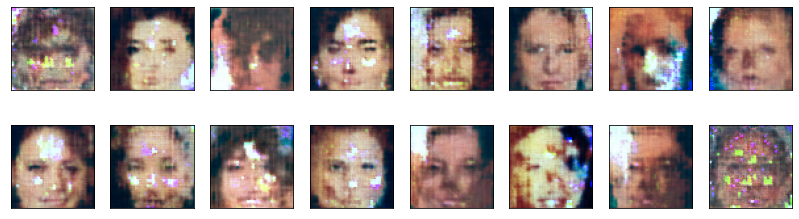

2023-11-27 18:54:49 | Epoch [34/50] | Batch 0/509 | d_loss: -106.3375 | g_loss: -124.9667
2023-11-27 18:54:57 | Epoch [34/50] | Batch 50/509 | d_loss: -95.2453 | g_loss: -115.4565
2023-11-27 18:55:05 | Epoch [34/50] | Batch 100/509 | d_loss: -84.5898 | g_loss: -141.4559
2023-11-27 18:55:13 | Epoch [34/50] | Batch 150/509 | d_loss: -105.9801 | g_loss: -120.8498
2023-11-27 18:55:21 | Epoch [34/50] | Batch 200/509 | d_loss: -81.9816 | g_loss: -152.5662
2023-11-27 18:55:29 | Epoch [34/50] | Batch 250/509 | d_loss: -90.5950 | g_loss: -149.0898
2023-11-27 18:55:36 | Epoch [34/50] | Batch 300/509 | d_loss: -104.7862 | g_loss: -165.0222
2023-11-27 18:55:44 | Epoch [34/50] | Batch 350/509 | d_loss: -60.7717 | g_loss: -145.3580
2023-11-27 18:55:52 | Epoch [34/50] | Batch 400/509 | d_loss: -85.4521 | g_loss: -98.8698
2023-11-27 18:56:00 | Epoch [34/50] | Batch 450/509 | d_loss: -72.8603 | g_loss: -106.6917
2023-11-27 18:56:08 | Epoch [34/50] | Batch 500/509 | d_loss: -92.1020 | g_loss: -134.9461


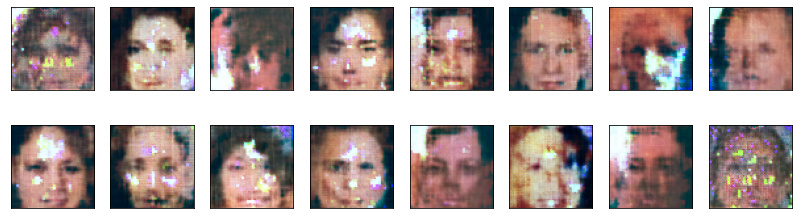

2023-11-27 18:56:13 | Epoch [35/50] | Batch 0/509 | d_loss: -92.5130 | g_loss: -119.8580
2023-11-27 18:56:20 | Epoch [35/50] | Batch 50/509 | d_loss: -90.8808 | g_loss: -123.9852
2023-11-27 18:56:28 | Epoch [35/50] | Batch 100/509 | d_loss: -73.3251 | g_loss: -98.3256
2023-11-27 18:56:36 | Epoch [35/50] | Batch 150/509 | d_loss: -89.2052 | g_loss: -110.1005
2023-11-27 18:56:44 | Epoch [35/50] | Batch 200/509 | d_loss: -117.5055 | g_loss: -107.2729
2023-11-27 18:56:52 | Epoch [35/50] | Batch 250/509 | d_loss: -105.7923 | g_loss: -115.7752
2023-11-27 18:57:00 | Epoch [35/50] | Batch 300/509 | d_loss: -94.6351 | g_loss: -74.4676
2023-11-27 18:57:08 | Epoch [35/50] | Batch 350/509 | d_loss: -122.3220 | g_loss: -157.3466
2023-11-27 18:57:16 | Epoch [35/50] | Batch 400/509 | d_loss: -67.0641 | g_loss: -160.7101
2023-11-27 18:57:23 | Epoch [35/50] | Batch 450/509 | d_loss: -81.1617 | g_loss: -161.2782
2023-11-27 18:57:31 | Epoch [35/50] | Batch 500/509 | d_loss: -78.6618 | g_loss: -145.8414


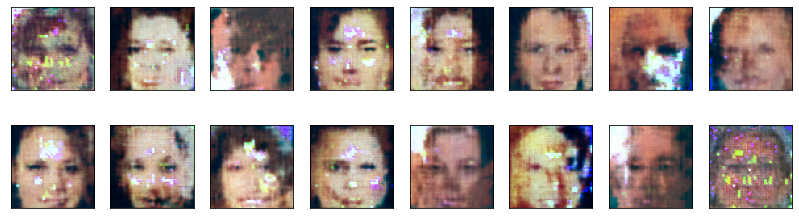

2023-11-27 18:57:37 | Epoch [36/50] | Batch 0/509 | d_loss: -83.8587 | g_loss: -98.5534
2023-11-27 18:57:45 | Epoch [36/50] | Batch 50/509 | d_loss: -112.2576 | g_loss: -76.9775
2023-11-27 18:57:53 | Epoch [36/50] | Batch 100/509 | d_loss: -95.2733 | g_loss: -168.9994
2023-11-27 18:58:01 | Epoch [36/50] | Batch 150/509 | d_loss: -82.8304 | g_loss: -68.6508
2023-11-27 18:58:09 | Epoch [36/50] | Batch 200/509 | d_loss: -93.4888 | g_loss: -149.1100
2023-11-27 18:58:17 | Epoch [36/50] | Batch 250/509 | d_loss: -138.3734 | g_loss: -131.8060
2023-11-27 18:58:24 | Epoch [36/50] | Batch 300/509 | d_loss: -114.9352 | g_loss: -115.2293
2023-11-27 18:58:32 | Epoch [36/50] | Batch 350/509 | d_loss: -101.0667 | g_loss: -129.6969
2023-11-27 18:58:40 | Epoch [36/50] | Batch 400/509 | d_loss: -94.3941 | g_loss: -184.1050
2023-11-27 18:58:48 | Epoch [36/50] | Batch 450/509 | d_loss: -96.1519 | g_loss: -186.8847
2023-11-27 18:58:56 | Epoch [36/50] | Batch 500/509 | d_loss: -91.8596 | g_loss: -180.3911


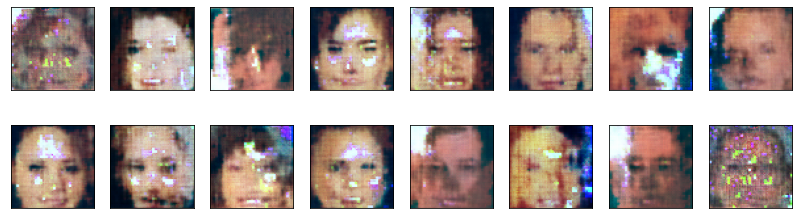

2023-11-27 18:59:01 | Epoch [37/50] | Batch 0/509 | d_loss: -94.2071 | g_loss: -195.8953
2023-11-27 18:59:09 | Epoch [37/50] | Batch 50/509 | d_loss: -67.4586 | g_loss: -124.7310
2023-11-27 18:59:17 | Epoch [37/50] | Batch 100/509 | d_loss: -79.9209 | g_loss: -117.1439
2023-11-27 18:59:25 | Epoch [37/50] | Batch 150/509 | d_loss: -87.4686 | g_loss: -196.2497
2023-11-27 18:59:33 | Epoch [37/50] | Batch 200/509 | d_loss: -114.9037 | g_loss: -119.3476
2023-11-27 18:59:41 | Epoch [37/50] | Batch 250/509 | d_loss: -88.4206 | g_loss: -176.2779
2023-11-27 18:59:49 | Epoch [37/50] | Batch 300/509 | d_loss: -72.5114 | g_loss: -100.2233
2023-11-27 18:59:57 | Epoch [37/50] | Batch 350/509 | d_loss: -90.4683 | g_loss: -206.9380
2023-11-27 19:00:05 | Epoch [37/50] | Batch 400/509 | d_loss: -122.3755 | g_loss: -154.6654
2023-11-27 19:00:12 | Epoch [37/50] | Batch 450/509 | d_loss: -79.2073 | g_loss: -141.1066
2023-11-27 19:00:20 | Epoch [37/50] | Batch 500/509 | d_loss: -84.0268 | g_loss: -122.2200


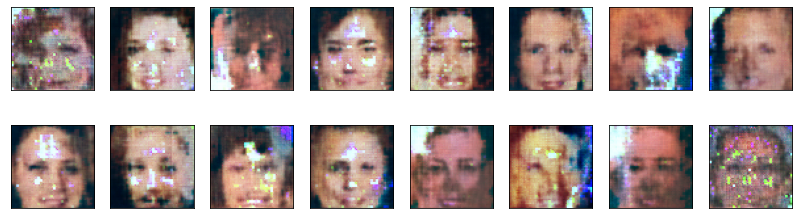

2023-11-27 19:00:26 | Epoch [38/50] | Batch 0/509 | d_loss: -111.6347 | g_loss: -170.2708
2023-11-27 19:00:34 | Epoch [38/50] | Batch 50/509 | d_loss: -108.2104 | g_loss: -130.6715
2023-11-27 19:00:42 | Epoch [38/50] | Batch 100/509 | d_loss: -94.7842 | g_loss: -132.4875
2023-11-27 19:00:50 | Epoch [38/50] | Batch 150/509 | d_loss: -108.2880 | g_loss: -88.2783
2023-11-27 19:00:58 | Epoch [38/50] | Batch 200/509 | d_loss: -108.6835 | g_loss: -90.6960
2023-11-27 19:01:06 | Epoch [38/50] | Batch 250/509 | d_loss: -96.7018 | g_loss: -178.5234
2023-11-27 19:01:14 | Epoch [38/50] | Batch 300/509 | d_loss: -100.6835 | g_loss: -174.4641
2023-11-27 19:01:22 | Epoch [38/50] | Batch 350/509 | d_loss: -89.5162 | g_loss: -152.3548
2023-11-27 19:01:30 | Epoch [38/50] | Batch 400/509 | d_loss: -116.7351 | g_loss: -136.5004
2023-11-27 19:01:38 | Epoch [38/50] | Batch 450/509 | d_loss: -93.9647 | g_loss: -149.7631
2023-11-27 19:01:45 | Epoch [38/50] | Batch 500/509 | d_loss: -71.3066 | g_loss: -176.241

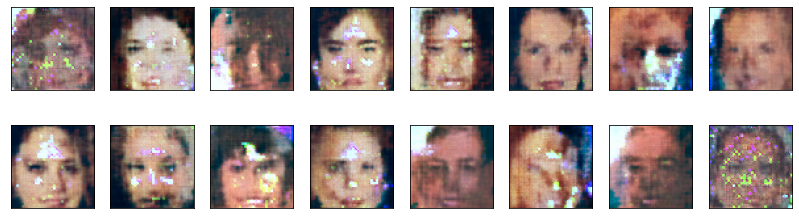

2023-11-27 19:01:51 | Epoch [39/50] | Batch 0/509 | d_loss: -100.3956 | g_loss: -138.3006
2023-11-27 19:01:59 | Epoch [39/50] | Batch 50/509 | d_loss: -92.2144 | g_loss: -197.2064
2023-11-27 19:02:07 | Epoch [39/50] | Batch 100/509 | d_loss: -78.0348 | g_loss: -144.9146
2023-11-27 19:02:14 | Epoch [39/50] | Batch 150/509 | d_loss: -58.1343 | g_loss: -143.2286
2023-11-27 19:02:23 | Epoch [39/50] | Batch 200/509 | d_loss: -63.9950 | g_loss: -66.5501
2023-11-27 19:02:31 | Epoch [39/50] | Batch 250/509 | d_loss: -95.4706 | g_loss: -157.6699
2023-11-27 19:02:39 | Epoch [39/50] | Batch 300/509 | d_loss: -61.1171 | g_loss: -93.3133
2023-11-27 19:02:47 | Epoch [39/50] | Batch 350/509 | d_loss: -103.7349 | g_loss: -163.3765
2023-11-27 19:03:03 | Epoch [39/50] | Batch 400/509 | d_loss: -121.6007 | g_loss: -176.5543
2023-11-27 19:03:19 | Epoch [39/50] | Batch 450/509 | d_loss: -110.7283 | g_loss: -109.7046
2023-11-27 19:03:34 | Epoch [39/50] | Batch 500/509 | d_loss: -84.4401 | g_loss: -140.7554


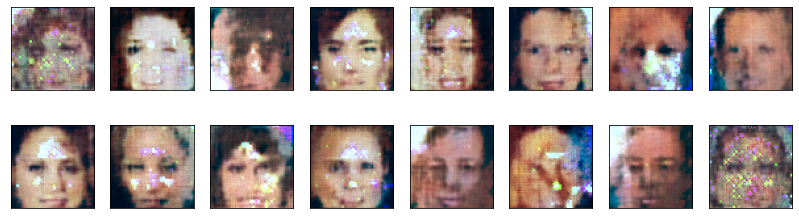

2023-11-27 19:03:42 | Epoch [40/50] | Batch 0/509 | d_loss: -99.7539 | g_loss: -130.8814
2023-11-27 19:03:58 | Epoch [40/50] | Batch 50/509 | d_loss: -110.4179 | g_loss: -108.2859
2023-11-27 19:04:13 | Epoch [40/50] | Batch 100/509 | d_loss: -108.3300 | g_loss: -178.0332
2023-11-27 19:04:29 | Epoch [40/50] | Batch 150/509 | d_loss: -107.7875 | g_loss: -87.7771
2023-11-27 19:04:45 | Epoch [40/50] | Batch 200/509 | d_loss: -99.5668 | g_loss: -136.0561
2023-11-27 19:05:01 | Epoch [40/50] | Batch 250/509 | d_loss: -95.7551 | g_loss: -143.9845
2023-11-27 19:05:17 | Epoch [40/50] | Batch 300/509 | d_loss: -106.4169 | g_loss: -143.5295
2023-11-27 19:05:28 | Epoch [40/50] | Batch 350/509 | d_loss: -80.0118 | g_loss: -139.7660
2023-11-27 19:05:44 | Epoch [40/50] | Batch 400/509 | d_loss: -90.5262 | g_loss: -122.1860
2023-11-27 19:06:00 | Epoch [40/50] | Batch 450/509 | d_loss: -94.0310 | g_loss: -185.1562
2023-11-27 19:06:15 | Epoch [40/50] | Batch 500/509 | d_loss: -101.6542 | g_loss: -128.260

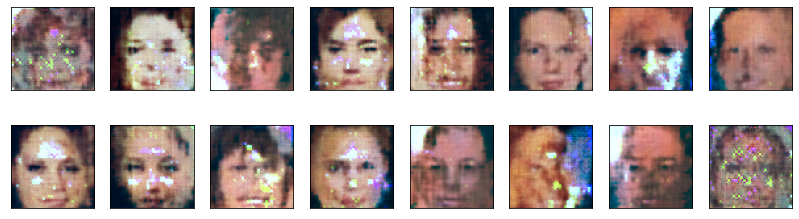

2023-11-27 19:06:22 | Epoch [41/50] | Batch 0/509 | d_loss: -82.8438 | g_loss: -116.7655
2023-11-27 19:06:38 | Epoch [41/50] | Batch 50/509 | d_loss: -103.0995 | g_loss: -179.1065
2023-11-27 19:06:54 | Epoch [41/50] | Batch 100/509 | d_loss: -112.0466 | g_loss: -105.9874
2023-11-27 19:07:10 | Epoch [41/50] | Batch 150/509 | d_loss: -99.0498 | g_loss: -163.3980
2023-11-27 19:07:25 | Epoch [41/50] | Batch 200/509 | d_loss: -101.5436 | g_loss: -120.4989
2023-11-27 19:07:41 | Epoch [41/50] | Batch 250/509 | d_loss: -111.7355 | g_loss: -157.3178
2023-11-27 19:07:57 | Epoch [41/50] | Batch 300/509 | d_loss: -77.0528 | g_loss: -123.2722
2023-11-27 19:08:09 | Epoch [41/50] | Batch 350/509 | d_loss: -74.4482 | g_loss: -58.6195
2023-11-27 19:08:25 | Epoch [41/50] | Batch 400/509 | d_loss: -91.5117 | g_loss: -149.2293
2023-11-27 19:08:41 | Epoch [41/50] | Batch 450/509 | d_loss: -116.7857 | g_loss: -106.1525
2023-11-27 19:08:57 | Epoch [41/50] | Batch 500/509 | d_loss: -110.8720 | g_loss: -161.57

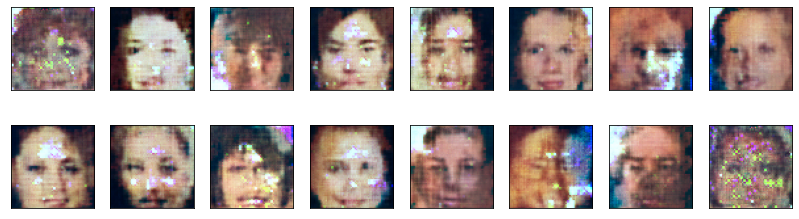

2023-11-27 19:09:04 | Epoch [42/50] | Batch 0/509 | d_loss: -76.1272 | g_loss: -127.3251
2023-11-27 19:09:20 | Epoch [42/50] | Batch 50/509 | d_loss: -94.7136 | g_loss: -138.6516
2023-11-27 19:09:35 | Epoch [42/50] | Batch 100/509 | d_loss: -96.0305 | g_loss: -152.1520
2023-11-27 19:09:51 | Epoch [42/50] | Batch 150/509 | d_loss: -103.0286 | g_loss: -124.5589
2023-11-27 19:10:07 | Epoch [42/50] | Batch 200/509 | d_loss: -88.9567 | g_loss: -129.5308
2023-11-27 19:10:23 | Epoch [42/50] | Batch 250/509 | d_loss: -135.2686 | g_loss: -136.1845
2023-11-27 19:10:39 | Epoch [42/50] | Batch 300/509 | d_loss: -112.5365 | g_loss: -165.2272
2023-11-27 19:10:50 | Epoch [42/50] | Batch 350/509 | d_loss: -100.6540 | g_loss: -113.9086
2023-11-27 19:11:05 | Epoch [42/50] | Batch 400/509 | d_loss: -99.5951 | g_loss: -92.7287
2023-11-27 19:11:21 | Epoch [42/50] | Batch 450/509 | d_loss: -97.8457 | g_loss: -133.2436
2023-11-27 19:11:37 | Epoch [42/50] | Batch 500/509 | d_loss: -82.2289 | g_loss: -113.4206

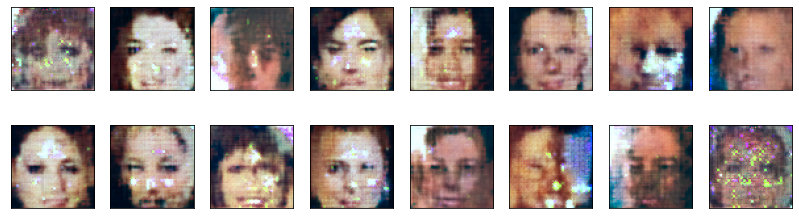

2023-11-27 19:11:44 | Epoch [43/50] | Batch 0/509 | d_loss: -90.3589 | g_loss: -120.1982
2023-11-27 19:12:00 | Epoch [43/50] | Batch 50/509 | d_loss: -106.4133 | g_loss: -120.5032
2023-11-27 19:12:15 | Epoch [43/50] | Batch 100/509 | d_loss: -88.9237 | g_loss: -152.2025
2023-11-27 19:12:31 | Epoch [43/50] | Batch 150/509 | d_loss: -101.2568 | g_loss: -139.5855
2023-11-27 19:12:47 | Epoch [43/50] | Batch 200/509 | d_loss: -104.4643 | g_loss: -123.5121
2023-11-27 19:13:03 | Epoch [43/50] | Batch 250/509 | d_loss: -59.4742 | g_loss: -139.3710
2023-11-27 19:13:19 | Epoch [43/50] | Batch 300/509 | d_loss: -106.3239 | g_loss: -127.0169
2023-11-27 19:13:31 | Epoch [43/50] | Batch 350/509 | d_loss: -95.1495 | g_loss: -178.8642
2023-11-27 19:13:47 | Epoch [43/50] | Batch 400/509 | d_loss: -96.4208 | g_loss: -163.1130
2023-11-27 19:14:03 | Epoch [43/50] | Batch 450/509 | d_loss: -112.3126 | g_loss: -163.9510
2023-11-27 19:14:18 | Epoch [43/50] | Batch 500/509 | d_loss: -77.2800 | g_loss: -156.47

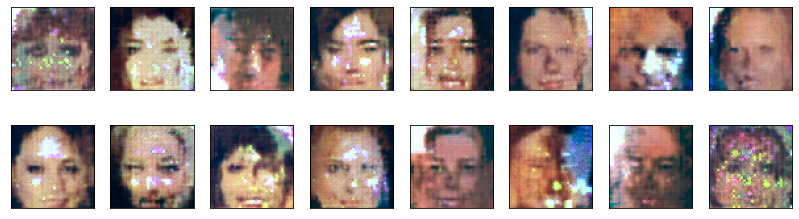

2023-11-27 19:14:26 | Epoch [44/50] | Batch 0/509 | d_loss: -95.3216 | g_loss: -125.4488
2023-11-27 19:14:42 | Epoch [44/50] | Batch 50/509 | d_loss: -89.8760 | g_loss: -187.7186
2023-11-27 19:14:58 | Epoch [44/50] | Batch 100/509 | d_loss: -95.8903 | g_loss: -130.2660
2023-11-27 19:15:14 | Epoch [44/50] | Batch 150/509 | d_loss: -101.1405 | g_loss: -151.5968
2023-11-27 19:15:29 | Epoch [44/50] | Batch 200/509 | d_loss: -140.5503 | g_loss: -132.7426
2023-11-27 19:15:45 | Epoch [44/50] | Batch 250/509 | d_loss: -107.1587 | g_loss: -124.1390
2023-11-27 19:16:01 | Epoch [44/50] | Batch 300/509 | d_loss: -102.9108 | g_loss: -157.5983
2023-11-27 19:16:12 | Epoch [44/50] | Batch 350/509 | d_loss: -99.1875 | g_loss: -103.4338
2023-11-27 19:16:28 | Epoch [44/50] | Batch 400/509 | d_loss: -75.9535 | g_loss: -137.6510
2023-11-27 19:16:44 | Epoch [44/50] | Batch 450/509 | d_loss: -92.6695 | g_loss: -151.8473
2023-11-27 19:16:52 | Epoch [44/50] | Batch 500/509 | d_loss: -82.5571 | g_loss: -144.145

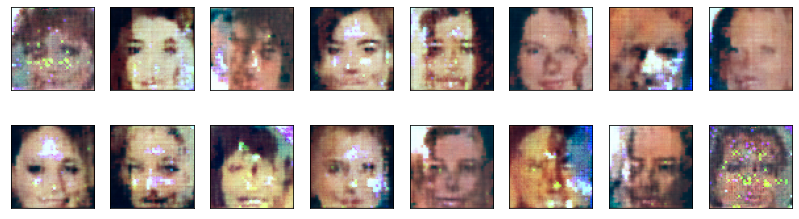

2023-11-27 19:16:58 | Epoch [45/50] | Batch 0/509 | d_loss: -113.3741 | g_loss: -128.4590
2023-11-27 19:17:06 | Epoch [45/50] | Batch 50/509 | d_loss: -105.6463 | g_loss: -170.3181
2023-11-27 19:17:14 | Epoch [45/50] | Batch 100/509 | d_loss: -114.4574 | g_loss: -112.3384
2023-11-27 19:17:22 | Epoch [45/50] | Batch 150/509 | d_loss: -119.2827 | g_loss: -154.8451
2023-11-27 19:17:29 | Epoch [45/50] | Batch 200/509 | d_loss: -114.3009 | g_loss: -139.1281
2023-11-27 19:17:37 | Epoch [45/50] | Batch 250/509 | d_loss: -119.8546 | g_loss: -147.4248
2023-11-27 19:17:45 | Epoch [45/50] | Batch 300/509 | d_loss: -92.5546 | g_loss: -112.3916
2023-11-27 19:17:53 | Epoch [45/50] | Batch 350/509 | d_loss: -117.5827 | g_loss: -135.8352
2023-11-27 19:18:01 | Epoch [45/50] | Batch 400/509 | d_loss: -98.5942 | g_loss: -175.8955
2023-11-27 19:18:08 | Epoch [45/50] | Batch 450/509 | d_loss: -73.2246 | g_loss: -136.5110
2023-11-27 19:18:16 | Epoch [45/50] | Batch 500/509 | d_loss: -101.0811 | g_loss: -136

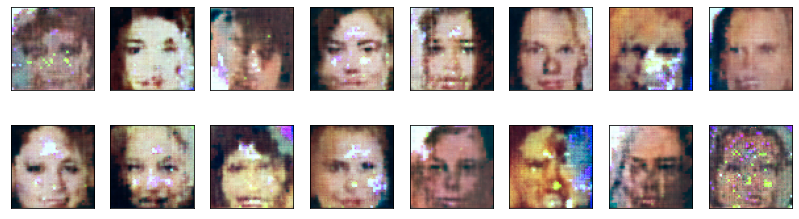

2023-11-27 19:18:21 | Epoch [46/50] | Batch 0/509 | d_loss: -63.5466 | g_loss: -151.6183
2023-11-27 19:18:29 | Epoch [46/50] | Batch 50/509 | d_loss: -113.5812 | g_loss: -151.6783
2023-11-27 19:18:37 | Epoch [46/50] | Batch 100/509 | d_loss: -83.0123 | g_loss: -175.2516
2023-11-27 19:18:45 | Epoch [46/50] | Batch 150/509 | d_loss: -107.8570 | g_loss: -144.3645
2023-11-27 19:18:53 | Epoch [46/50] | Batch 200/509 | d_loss: -122.2321 | g_loss: -145.8105
2023-11-27 19:19:01 | Epoch [46/50] | Batch 250/509 | d_loss: -102.0832 | g_loss: -160.9426
2023-11-27 19:19:09 | Epoch [46/50] | Batch 300/509 | d_loss: -86.3712 | g_loss: -173.5541
2023-11-27 19:19:17 | Epoch [46/50] | Batch 350/509 | d_loss: -70.1582 | g_loss: -159.5021
2023-11-27 19:19:25 | Epoch [46/50] | Batch 400/509 | d_loss: -96.7042 | g_loss: -154.3484
2023-11-27 19:19:32 | Epoch [46/50] | Batch 450/509 | d_loss: -102.5745 | g_loss: -127.0761
2023-11-27 19:19:40 | Epoch [46/50] | Batch 500/509 | d_loss: -92.1557 | g_loss: -185.08

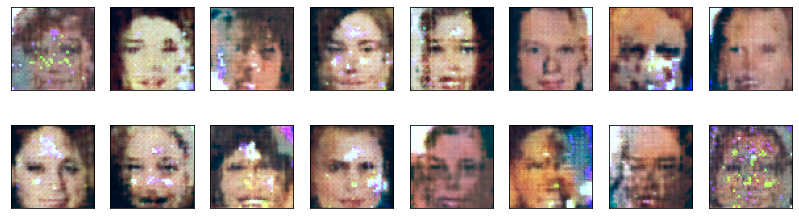

2023-11-27 19:19:46 | Epoch [47/50] | Batch 0/509 | d_loss: -106.3683 | g_loss: -110.7858
2023-11-27 19:19:54 | Epoch [47/50] | Batch 50/509 | d_loss: -106.5802 | g_loss: -148.7210
2023-11-27 19:20:02 | Epoch [47/50] | Batch 100/509 | d_loss: -74.1482 | g_loss: -116.7702
2023-11-27 19:20:10 | Epoch [47/50] | Batch 150/509 | d_loss: -74.5498 | g_loss: -169.7345
2023-11-27 19:20:18 | Epoch [47/50] | Batch 200/509 | d_loss: -99.1520 | g_loss: -178.2970
2023-11-27 19:20:26 | Epoch [47/50] | Batch 250/509 | d_loss: -114.9046 | g_loss: -168.7667
2023-11-27 19:20:34 | Epoch [47/50] | Batch 300/509 | d_loss: -55.1737 | g_loss: -152.1246
2023-11-27 19:20:42 | Epoch [47/50] | Batch 350/509 | d_loss: -103.1715 | g_loss: -137.4163
2023-11-27 19:20:50 | Epoch [47/50] | Batch 400/509 | d_loss: -98.6599 | g_loss: -206.9609
2023-11-27 19:20:58 | Epoch [47/50] | Batch 450/509 | d_loss: -108.2687 | g_loss: -162.5740
2023-11-27 19:21:06 | Epoch [47/50] | Batch 500/509 | d_loss: -125.2104 | g_loss: -205.3

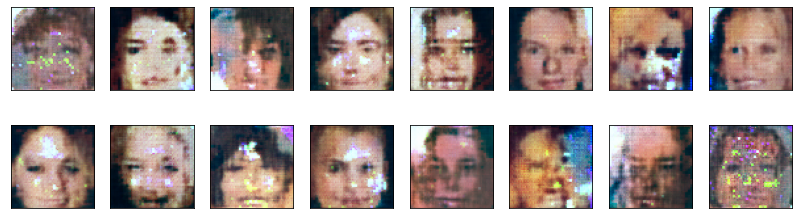

2023-11-27 19:21:11 | Epoch [48/50] | Batch 0/509 | d_loss: -115.5374 | g_loss: -161.2452
2023-11-27 19:21:19 | Epoch [48/50] | Batch 50/509 | d_loss: -76.1520 | g_loss: -159.3456
2023-11-27 19:21:27 | Epoch [48/50] | Batch 100/509 | d_loss: -90.3965 | g_loss: -159.1670
2023-11-27 19:21:35 | Epoch [48/50] | Batch 150/509 | d_loss: -88.4426 | g_loss: -134.3027
2023-11-27 19:21:43 | Epoch [48/50] | Batch 200/509 | d_loss: -98.7564 | g_loss: -185.2405
2023-11-27 19:21:51 | Epoch [48/50] | Batch 250/509 | d_loss: -82.6543 | g_loss: -202.2025
2023-11-27 19:21:59 | Epoch [48/50] | Batch 300/509 | d_loss: -108.7022 | g_loss: -173.8826
2023-11-27 19:22:06 | Epoch [48/50] | Batch 350/509 | d_loss: -107.2608 | g_loss: -163.5389
2023-11-27 19:22:14 | Epoch [48/50] | Batch 400/509 | d_loss: -64.4029 | g_loss: -170.9085
2023-11-27 19:22:22 | Epoch [48/50] | Batch 450/509 | d_loss: -123.2475 | g_loss: -179.3240
2023-11-27 19:22:30 | Epoch [48/50] | Batch 500/509 | d_loss: -106.2273 | g_loss: -188.25

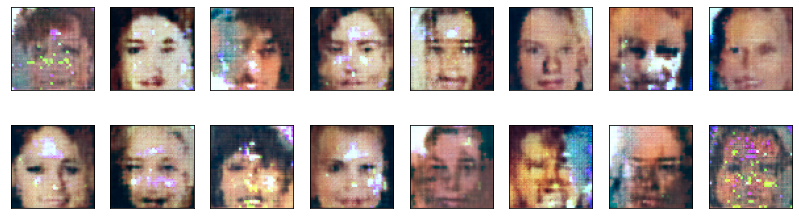

2023-11-27 19:22:36 | Epoch [49/50] | Batch 0/509 | d_loss: -121.2199 | g_loss: -140.2890
2023-11-27 19:22:44 | Epoch [49/50] | Batch 50/509 | d_loss: -91.8069 | g_loss: -168.5368
2023-11-27 19:22:52 | Epoch [49/50] | Batch 100/509 | d_loss: -80.7369 | g_loss: -148.0630
2023-11-27 19:23:00 | Epoch [49/50] | Batch 150/509 | d_loss: -80.6316 | g_loss: -133.0609
2023-11-27 19:23:08 | Epoch [49/50] | Batch 200/509 | d_loss: -113.3221 | g_loss: -137.1251
2023-11-27 19:23:16 | Epoch [49/50] | Batch 250/509 | d_loss: -75.9602 | g_loss: -155.4549
2023-11-27 19:23:24 | Epoch [49/50] | Batch 300/509 | d_loss: -118.8402 | g_loss: -152.7922
2023-11-27 19:23:31 | Epoch [49/50] | Batch 350/509 | d_loss: -110.4383 | g_loss: -185.4663
2023-11-27 19:23:39 | Epoch [49/50] | Batch 400/509 | d_loss: -96.0807 | g_loss: -164.2483
2023-11-27 19:23:47 | Epoch [49/50] | Batch 450/509 | d_loss: -112.1520 | g_loss: -157.1699
2023-11-27 19:23:55 | Epoch [49/50] | Batch 500/509 | d_loss: -94.2253 | g_loss: -188.18

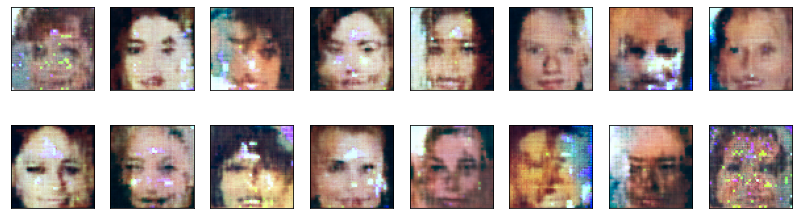

2023-11-27 19:24:01 | Epoch [50/50] | Batch 0/509 | d_loss: -99.2203 | g_loss: -141.3846
2023-11-27 19:24:09 | Epoch [50/50] | Batch 50/509 | d_loss: -82.2264 | g_loss: -181.1835
2023-11-27 19:24:17 | Epoch [50/50] | Batch 100/509 | d_loss: -91.6791 | g_loss: -184.4449
2023-11-27 19:24:25 | Epoch [50/50] | Batch 150/509 | d_loss: -110.8207 | g_loss: -134.8347
2023-11-27 19:24:33 | Epoch [50/50] | Batch 200/509 | d_loss: -101.1682 | g_loss: -168.3040
2023-11-27 19:24:41 | Epoch [50/50] | Batch 250/509 | d_loss: -71.0125 | g_loss: -133.0204
2023-11-27 19:24:49 | Epoch [50/50] | Batch 300/509 | d_loss: -76.6532 | g_loss: -183.4500
2023-11-27 19:24:57 | Epoch [50/50] | Batch 350/509 | d_loss: -93.4037 | g_loss: -161.3023
2023-11-27 19:25:05 | Epoch [50/50] | Batch 400/509 | d_loss: -63.2607 | g_loss: -142.7619
2023-11-27 19:25:13 | Epoch [50/50] | Batch 450/509 | d_loss: -82.5427 | g_loss: -171.3415
2023-11-27 19:25:21 | Epoch [50/50] | Batch 500/509 | d_loss: -108.0082 | g_loss: -146.8578

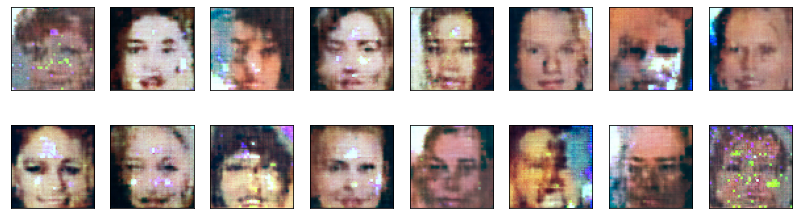

In [48]:
fixed_latent_vector = torch.randn(16, latent_dim, 1, 1).float().cuda()

losses = []
for epoch in range(n_epochs):
    for batch_i, real_images in enumerate(dataloader):
        real_images = real_images.to(device)
        
        g_loss = generator_step(batch_size, latent_dim)
        
        d_loss = discriminator_step(batch_size, latent_dim, real_images)
        
        if batch_i % print_every == 0:
            # append discriminator loss and generator loss
            d = d_loss['loss'].item()
            g = g_loss['loss'].item()
            losses.append((d, g))
            # print discriminator and generator loss
            time = str(datetime.now()).split('.')[0]
            print(f'{time} | Epoch [{epoch+1}/{n_epochs}] | Batch {batch_i}/{len(dataloader)} | d_loss: {d:.4f} | g_loss: {g:.4f}')
    
    # display images during training
    generator.eval()
    generated_images = generator(fixed_latent_vector)
    display(generated_images)
    generator.train()

### Training losses

Plot the training losses for the generator and discriminator.

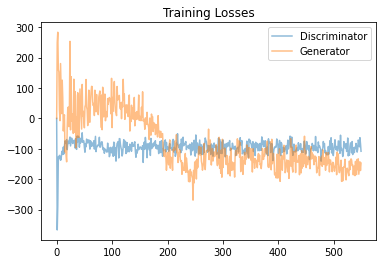

In [49]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses.T[1], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()